

### Task
The task involves optimising the pre-processing of features for a simple classification problem, using visualisation (unsupervised learning) to help guide you in choosing good feature vector selection. The idea is to get *insight* into the data **using visualisation** to create effective machine learning models.

### Classifier
We will only use the most basic of classifiers in this example -- **k nearest neighbours** -- and focus on how to process the features to make this simple algorithm work as effectively as possible. Many modern approaches would use deep learning to learn an end-to-end classifier that infers appropriate feature extraction directly.

Everything to do the analysis and testing is provided for you. Your task is to modify the parameters that affect the creation of the feature vectors (see the green highlighted box below) and explore different visualisations to help identify a good feature transform.


In [1]:
from __future__ import print_function, division
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import audio_task
%matplotlib inline

## Motivation
This topic is essentially the operations behind the **Stane** project [Paper](http://www.dcs.gla.ac.uk/~rod/publications/MurWilHugQua08.pdf) [Video](http://www.dcs.gla.ac.uk/~rod/Videos/i_chi2.mov)


This used 3D printed textures on mobile devices. Scratching the fingernail across the surface generates distinctive sounds, which are propagated through the case and picked up by a piezo microphone. Different regions have different textures, and thus the area being rubbed can be determined by analysing the audio signal.

<img src="imgs/piezo.png" width="400px">
<img src="imgs/stane_real.png" width="400px">
<!-- <img src="imgs/shell.png" width="400px">
<img src="imgs/disc.png" width="400px"> -->



### Feature vectors
In almost all machine learning contexts, we predict outputs given a **fixed length** set of features; the input space a fixed dimension $d$. Each of those features is usually (but not always) continuous-valued.

Sometimes the data fall naturally into this space (e.g. classifying the iris type by 3 physical measurements). In cases such as in audio classification, though, we want to make predictions based on *time series*; a set of measurements of the same variable set made repeatedly over time.

#### Windowing
One general solution to this time series problem is to break a sequence up into a fixed length sequence of previous measurements. For example the measurements $[x_{t=t}, x_{t=t-1}, x_{t=t-2}, \dots, x_{t=t-d}]$ might make up the feature vector. This process is known as *windowing*, because we chop up the data into fixed length windows by "sliding" a time window along the data. **Consecutive (but possible discontiguous or overlapping) windows are almost universally used in audio contexts.**

<img src="imgs/contiguous_windows.png">
<img src="imgs/overlapping_windows.png">

These windows can overlap, which increases the size of the training set, but excessive overlapping can capture lots of redundant features examples. This can increase overfitting and training time without improving the classifier performance. Balancing the size of the windows (and thus the feature vector size $d$) and the amount of overlap is a matter of experimentation and domain knowledge.

-----------------

## Feature transforms

Often the "natural" raw form of the data can be difficult to classify. This might be because it has very high dimension, it is very noisy, or the classification boundary just isn't very compatible with your classifier (e.g. the class borders in the original space are highly-nonlinear and you are using a linear classifier). 

**Feature engineering** is the art of finding transforms of the raw data that increase classifier performance. These can often be simple, such as dropping some of the measurements entirely (under the assumption that they are irrelvant), or averaging measurements together (under the assumption that this reduces noise).

### Audio transforms
**Audio** data tends to be very high dimensional -- you might get 4000 to 44100 measurements for a single second of data.  A single audio sample has very little information indeed; it is the longer-term (millisecond to second) properties that have all the interesting information. 

So want transforms that pull out interesting features **over time**. The classical feature transform is the **Fourier transform**, which rewrites a signal varying over time as a sum of sinusoidal (periodic) components. This functions much like our ear works, splitting up audio in **frequency bands**, each of which has a **phase** and an **amplitude**. Many of these are already implemented in standard libraries, like the Fast Fourier Transform (fft) and the Discrete Cosine Transform (dct). We will use these in our classification problem.

# The challenge
<a id="challenge"></a>
You have to use visualisation strategies to choose a feature vector transform for a classifier that classifies the region of a device that is being touched based on the sound recorded from a piezo contact microphone. There are four possible touch regions and also a silence/handling noise class (class 0):

<img src="imgs/regions.png"> 

The data are all in the `data/` folder.

You have training data for these regions, `challenge_train_{01234}.wav`

See the code below which plots test datasets consisting of labeled mixtures of these classes alongside your predicted labels.  The code below loads the data from 4Khz 16 bit mono wavefiles into a collection of features vectors `X` and a corresponding set of labels `y`.  

### Feature selection
You can modify the feature selection properties set below to adjust the results. **The rest of the pipeline is fixed  -- you cannot modify the classifier itself in this exercise.**
<div class="alert alert-box alert-success">
    
This cell below is the only control you have over the performance of the classification. You will use the visualisation techniques to explore how these transforms change the data you get. NOTE: you may well not understand the meaning of the parameters. Use the visualisations to help guide you to a good choice.
</div>

In [2]:
######### PARAMETERS ##################
# You can change these values
# 1 sample = 1/4096 of a second

size = 2 ** 12
parameters = {
    'size': size,  # ~1 second window
    'step': size // 16,  # 1/4 of window size
    'decimate': 2,    # keep more frequency information
    'feature_range': (0.0, 1.0),  # wider frequency range
    'window_fn': "boxcar",  # better for spectral analysis
    'feature_fn': "dct"  # try this first, then experiment with "dct" and "cepstrum"
}

#####################################

# valid window_fns: ['hamming', 'hann', 'boxcar', 'blackmanharris']
# valid feature_fns: ['dct', 'fft', 'fft_phase', 'dct_phase', 'cepstrum', 'raw'])

Run the following cells to (re)load the data into a set of features and labels

In [3]:
X, y = audio_task.load_data(parameters)
print("X shape", X.shape, "y shape", y.shape)

Loading into 336 windows of length 4096
Loading into 807 windows of length 4096
Loading into 692 windows of length 4096
Loading into 985 windows of length 4096
Loading into 955 windows of length 4096
Using dct transform and a boxcar window.
X shape (3775, 2048) y shape (3775,)


In [4]:
# if you don't have UMAP installed, uncomment and run the line below (once only)
# !pip install --no-cache --user umap-learn

## Visualisation

We can visualise these features. Experiment with using:
* PCA `sklearn.decomposition.pca`
* LLE `sklearn.manifold.LocallyLinearEmbedding`
* ISOMAP `sklearn.manifold.Isomap`
* tSNE `sklearn.manifold.TSNE`
* UMAP `umap`

You can use alternative visualisation methods if you wish. **You may need to subsample the features to visualise in reasonable time.**. For example, you can subsample to just every 10th feature vector using `X[::10, :]`

Use the visualisations to find a feature vector selection that you expect to perform well with a a kNN classifier. Use the visualisation to explore these transforms rather than trial and error with the classifier itself.

<div class="alert alert-box alert-success"> 

**Task**: iterate over visualisations and tweaks to the feature preprocessing to see if you can find a structure that separates classes well.
</div>

In [5]:
import os
import sys
import warnings

def suppress_warnings_and_prints(func, *args, **kwargs):
    """
    Suppress both warnings and print statements from a given function.

    Args:
        func (callable): The function to execute.
        *args: Positional arguments to pass to the function.
        **kwargs: Keyword arguments to pass to the function.

    Returns:
        Any: The result of the function call.
    """
    with warnings.catch_warnings():
        warnings.simplefilter("ignore")  # Suppress warnings
        with open(os.devnull, 'w') as fnull:
            # Redirect stdout and stderr to suppress prints
            old_stdout, old_stderr = sys.stdout, sys.stderr
            sys.stdout, sys.stderr = fnull, fnull
            try:
                return func(*args, **kwargs)  # Execute the function
            finally:
                # Restore original stdout and stderr
                sys.stdout, sys.stderr = old_stdout, old_stderr


# Code Explanation

The next part of the code iterates over feature and window functions and creates a graph with all four subgraph, each representing one visualization method.

In [6]:
import sklearn.decomposition, sklearn.manifold
import umap.umap_ as umap

def try_with_different_params(parameters):
    feature_fns = ['dct', 'fft', 'fft_phase', 'dct_phase', 'cepstrum', 'raw']
    window_fns = ['hamming', 'hann', 'boxcar', 'blackmanharris']

    visualizations = [
        (sklearn.manifold.LocallyLinearEmbedding(n_components=2, n_neighbors=15), "LLE"),
        (sklearn.manifold.Isomap(n_components=2, n_neighbors=15), "ISOMAP"),
        (sklearn.manifold.TSNE(n_components=2, perplexity=5, n_iter=300, random_state=42), "TSNE"),
        (umap.UMAP(n_components=2, n_neighbors=15, min_dist=0.1, metric="euclidean"), "UMAP"),

    ]

    for f in feature_fns:

        for w in window_fns:
            parameters["window_fn"] = w
            parameters["feature_fn"] = f                        
            X, y = audio_task.load_data(parameters)
            classifier = audio_task.knn_fit(X, y)
            subsample = 5
            new_x = X[::subsample, :]
            suppress_warnings_and_prints(audio_task.run_secret_test, classifier, parameters)
            fig, axs = plt.subplots(2, 2, figsize=(10, 10))  # Create a 2x2 grid of subplots
            fig.suptitle(f'Feature Function: {f}, Window Function: {w}', fontsize=16)
            for i, vis in enumerate(visualizations):
                v, v_name = vis

                
                v_X = v.fit_transform(new_x)

                # Determine subplot position
                row, col = divmod(i, 2)
                ax = axs[row, col]

                # Show scatter plot of the first two dimensions
                scatter = ax.scatter(
                    v_X[:, 0],
                    v_X[:, 1],
                    c=y[::subsample],
                    cmap="tab10",
                    vmin=0,
                    vmax=10,
                    alpha=0.7,
                    s=8,
                )
                
                ax.set_title(f"Visualization {v_name}")

                # Add a legend to the subplot
                legend1 = ax.legend(*scatter.legend_elements(num=4), title="Class")
                ax.add_artist(legend1)

                # Add horizontal and vertical reference lines
                ax.axhline(0, color="k", alpha=0.1)
                ax.axvline(0, color="k", alpha=0.1)

            # Adjust layout for readability
            plt.tight_layout(rect=[0, 0, 1, 0.95])
            plt.show()

/Users/abutayli/.local/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Loading into 336 windows of length 4096
Loading into 807 windows of length 4096
Loading into 692 windows of length 4096
Loading into 985 windows of length 4096
Loading into 955 windows of length 4096
Using dct transform and a hamming window.


/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


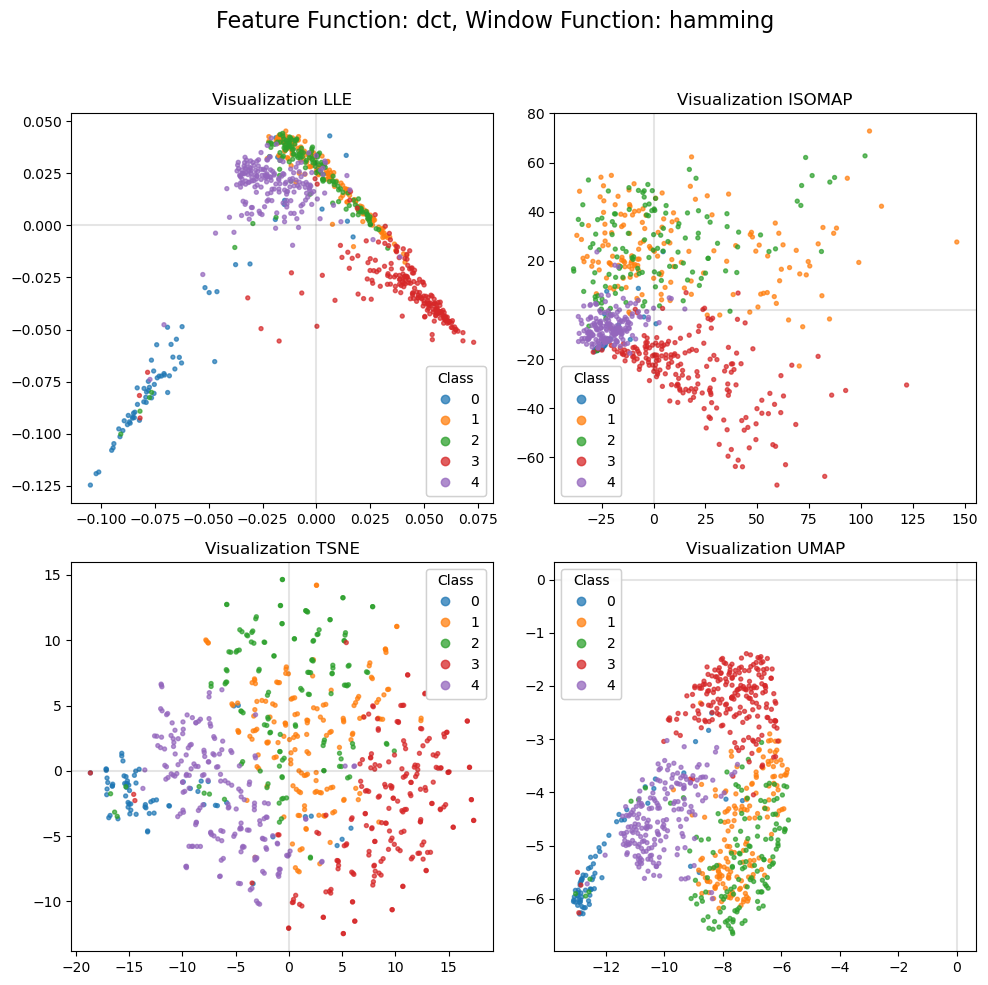

Loading into 336 windows of length 4096
Loading into 807 windows of length 4096
Loading into 692 windows of length 4096
Loading into 985 windows of length 4096
Loading into 955 windows of length 4096
Using dct transform and a hann window.


/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


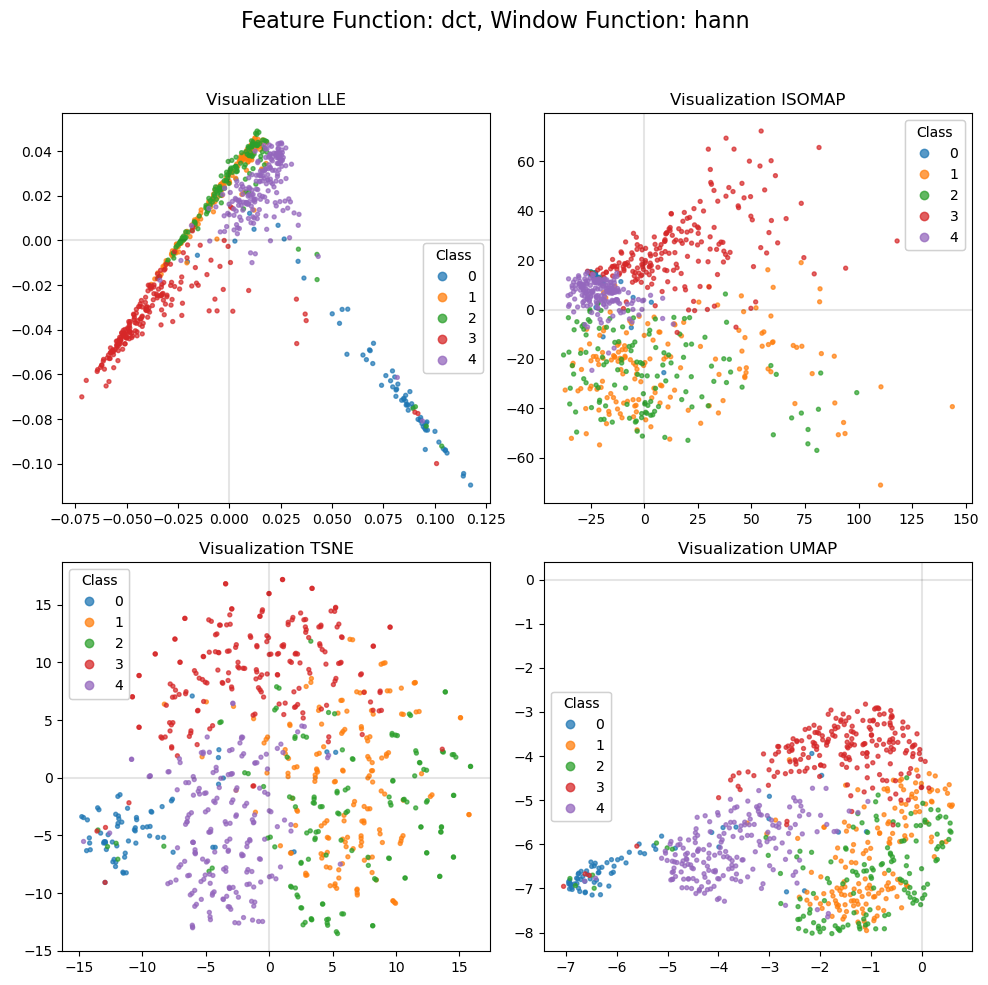

Loading into 336 windows of length 4096
Loading into 807 windows of length 4096
Loading into 692 windows of length 4096
Loading into 985 windows of length 4096
Loading into 955 windows of length 4096
Using dct transform and a boxcar window.


/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


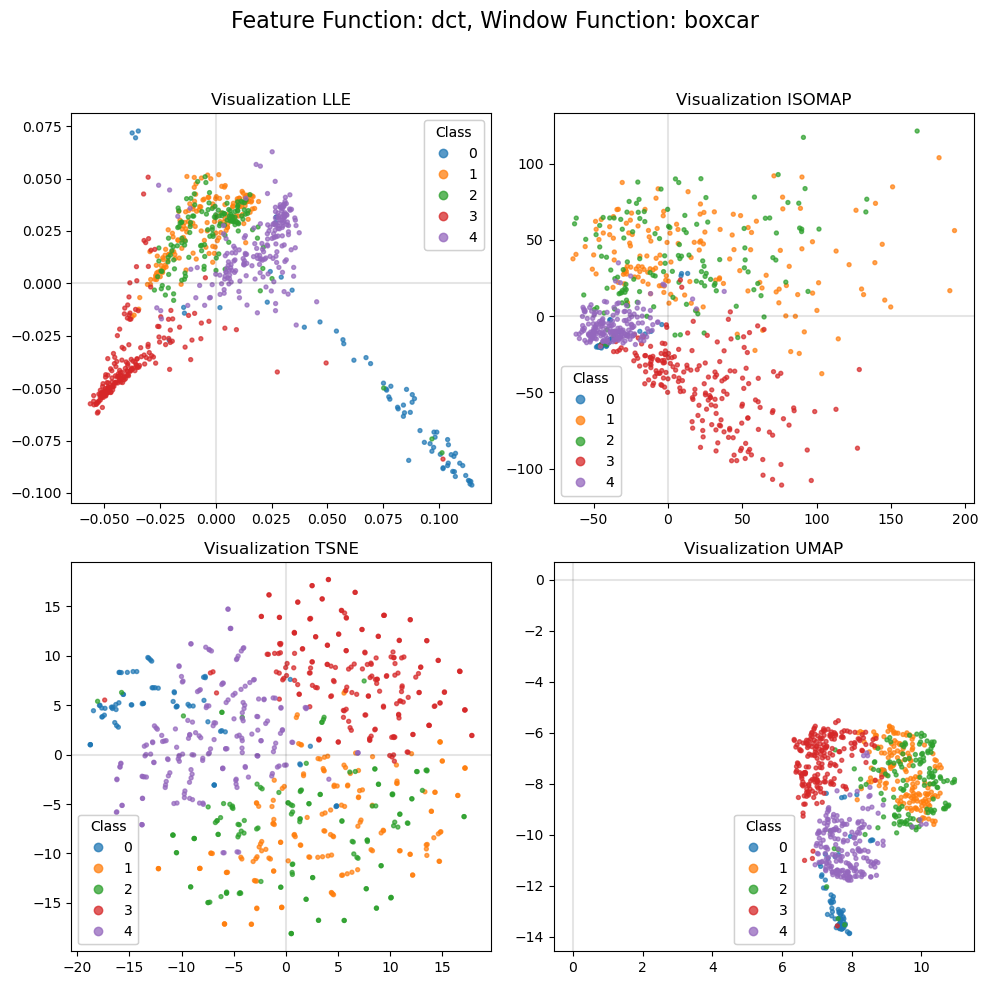

Loading into 336 windows of length 4096
Loading into 807 windows of length 4096
Loading into 692 windows of length 4096
Loading into 985 windows of length 4096
Loading into 955 windows of length 4096
Using dct transform and a blackmanharris window.


/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


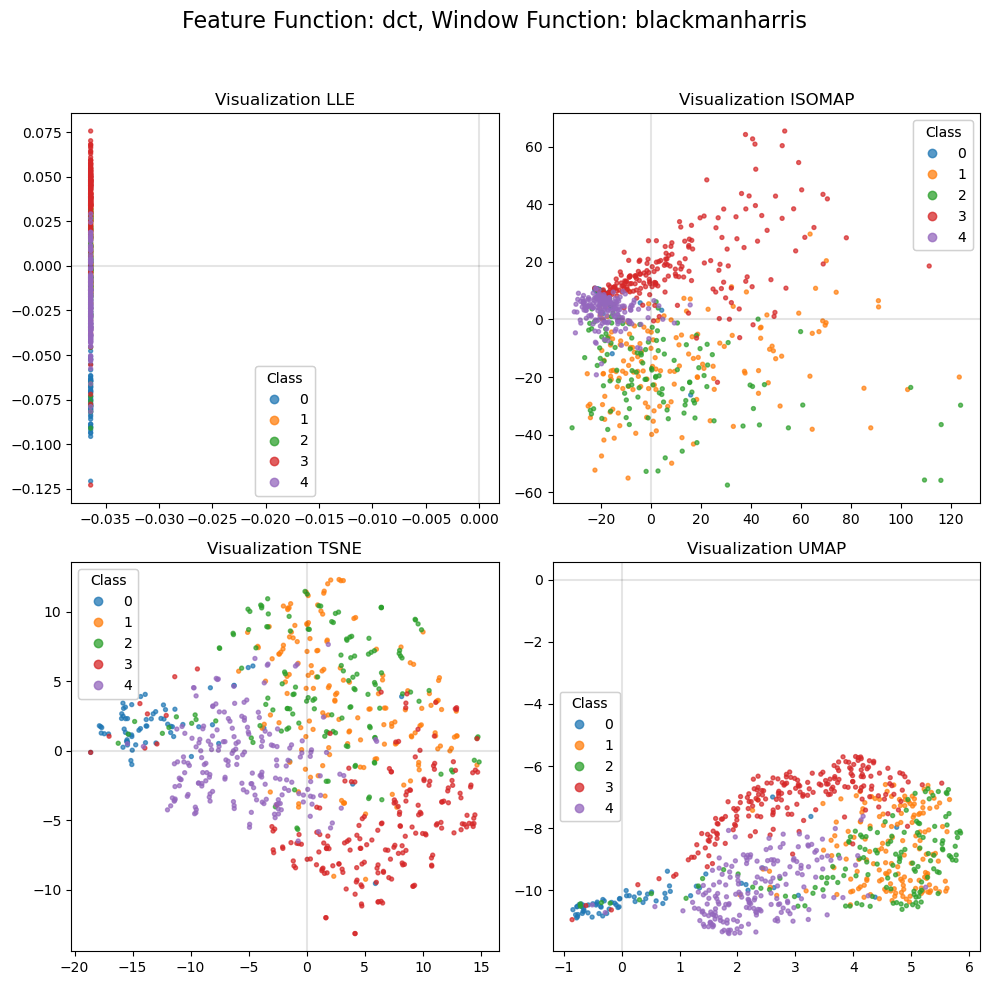

Loading into 336 windows of length 4096
Loading into 807 windows of length 4096
Loading into 692 windows of length 4096
Loading into 985 windows of length 4096
Loading into 955 windows of length 4096
Using fft transform and a hamming window.


/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


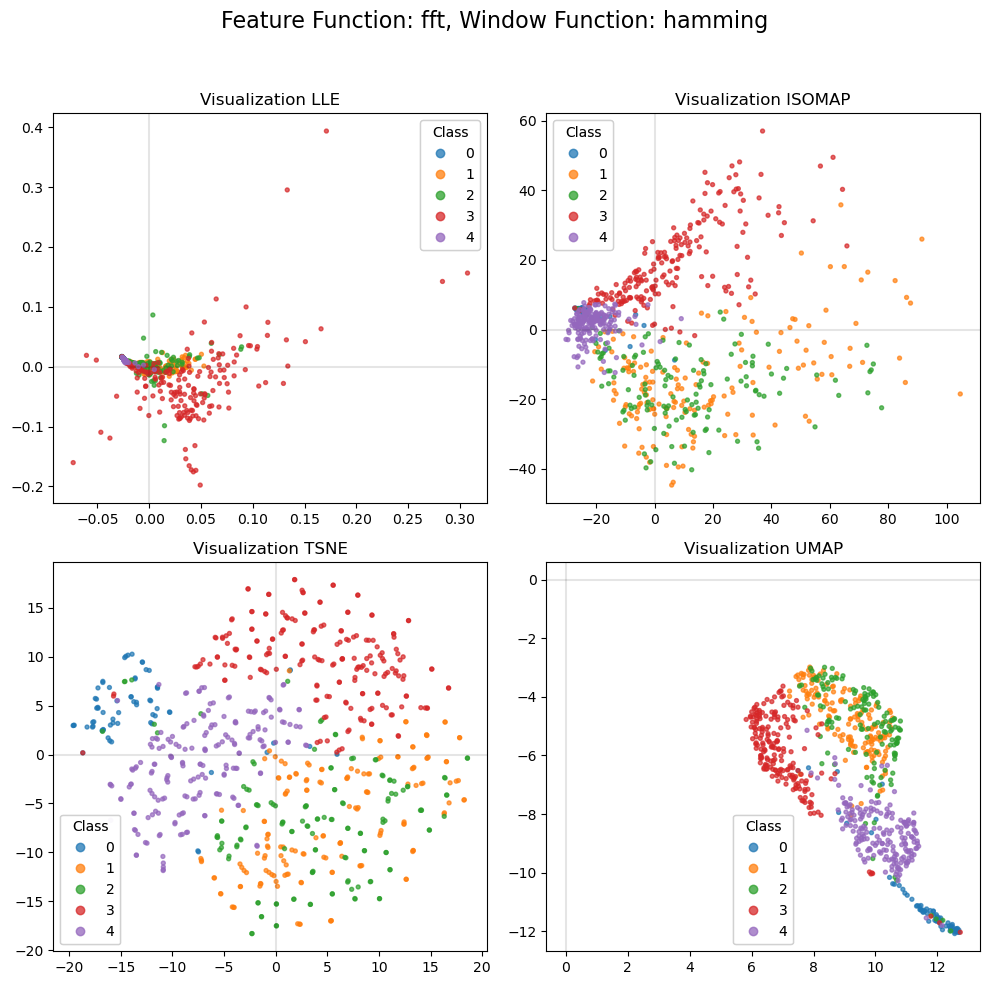

Loading into 336 windows of length 4096
Loading into 807 windows of length 4096
Loading into 692 windows of length 4096
Loading into 985 windows of length 4096
Loading into 955 windows of length 4096
Using fft transform and a hann window.


/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


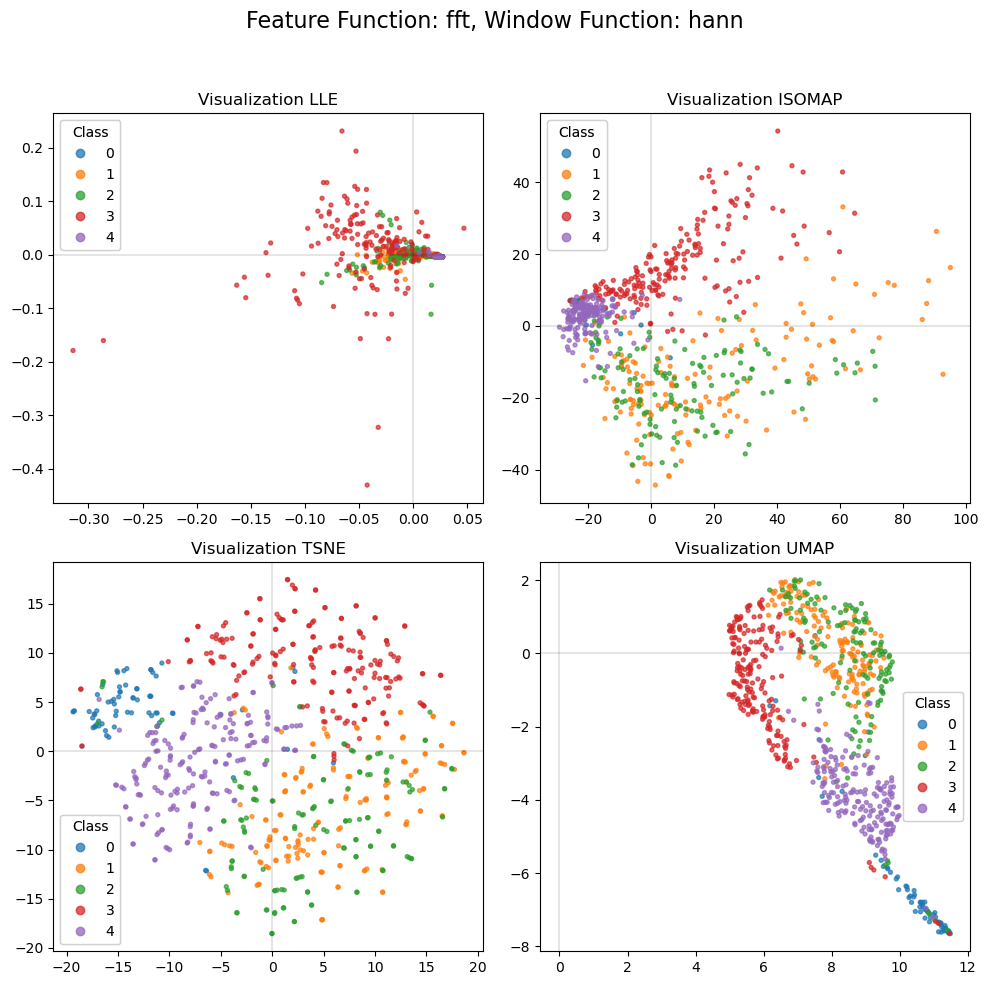

Loading into 336 windows of length 4096
Loading into 807 windows of length 4096
Loading into 692 windows of length 4096
Loading into 985 windows of length 4096
Loading into 955 windows of length 4096
Using fft transform and a boxcar window.


/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


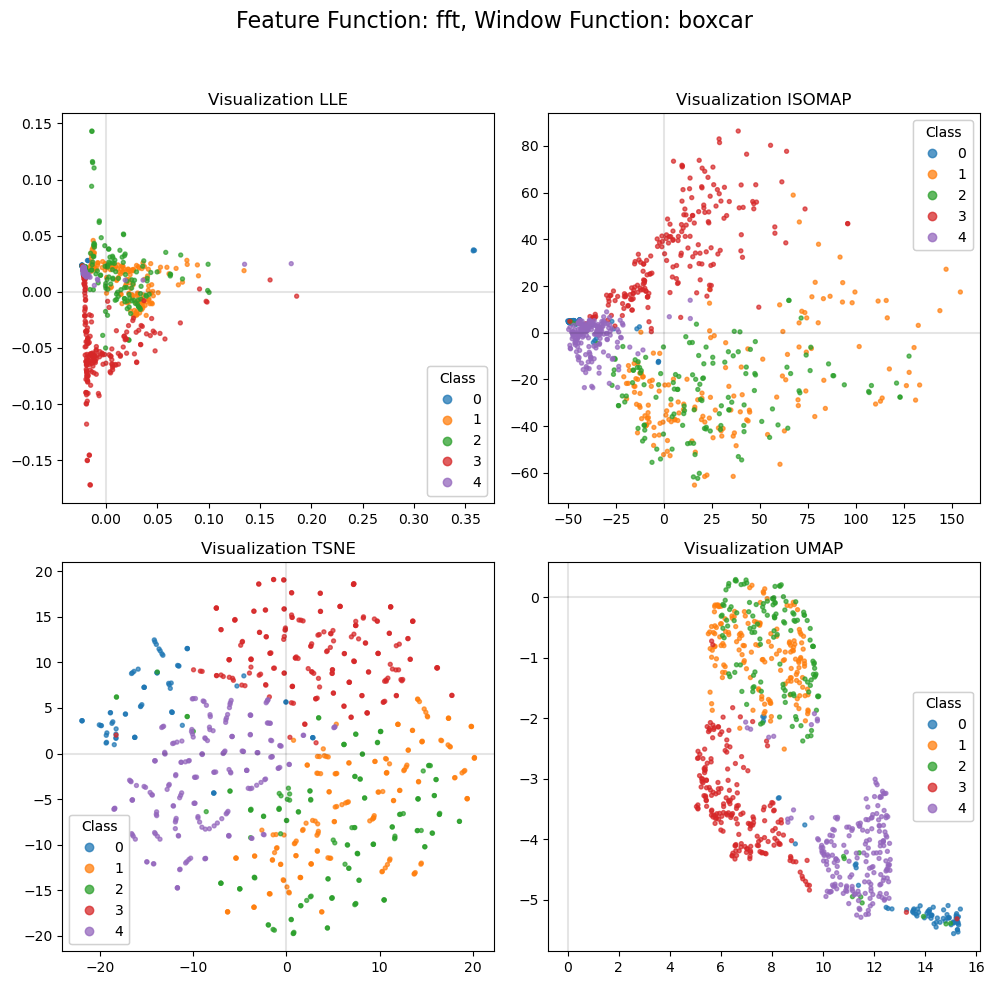

Loading into 336 windows of length 4096
Loading into 807 windows of length 4096
Loading into 692 windows of length 4096
Loading into 985 windows of length 4096
Loading into 955 windows of length 4096
Using fft transform and a blackmanharris window.


/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


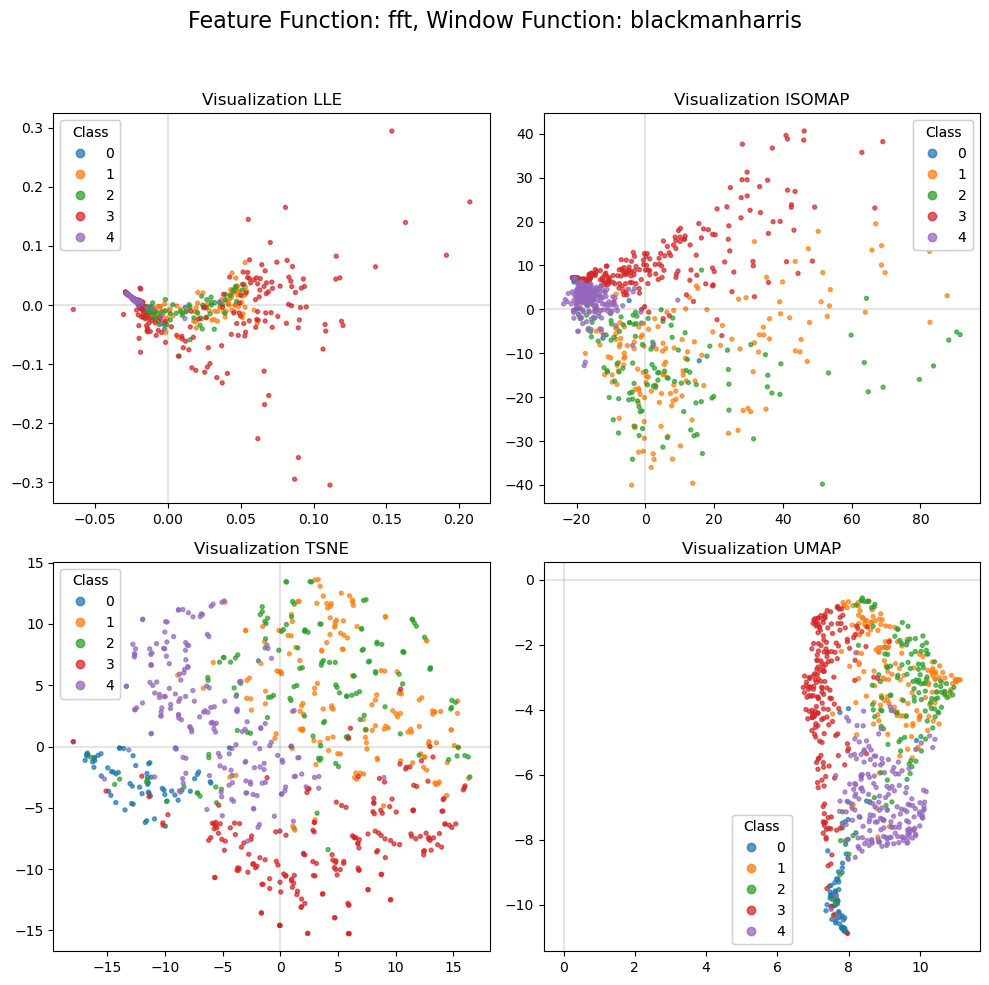

Loading into 336 windows of length 4096
Loading into 807 windows of length 4096
Loading into 692 windows of length 4096
Loading into 985 windows of length 4096
Loading into 955 windows of length 4096
Using fft_phase transform and a hamming window.


/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


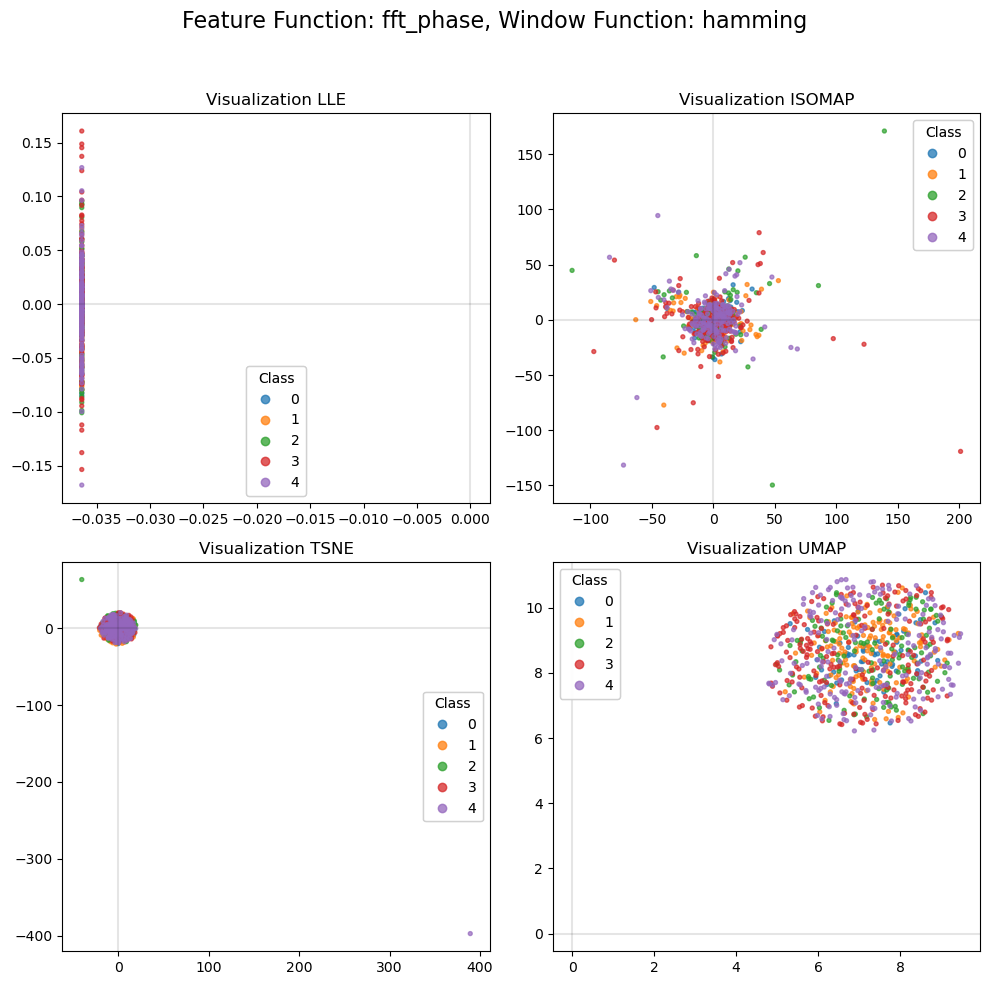

Loading into 336 windows of length 4096
Loading into 807 windows of length 4096
Loading into 692 windows of length 4096
Loading into 985 windows of length 4096
Loading into 955 windows of length 4096
Using fft_phase transform and a hann window.


/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


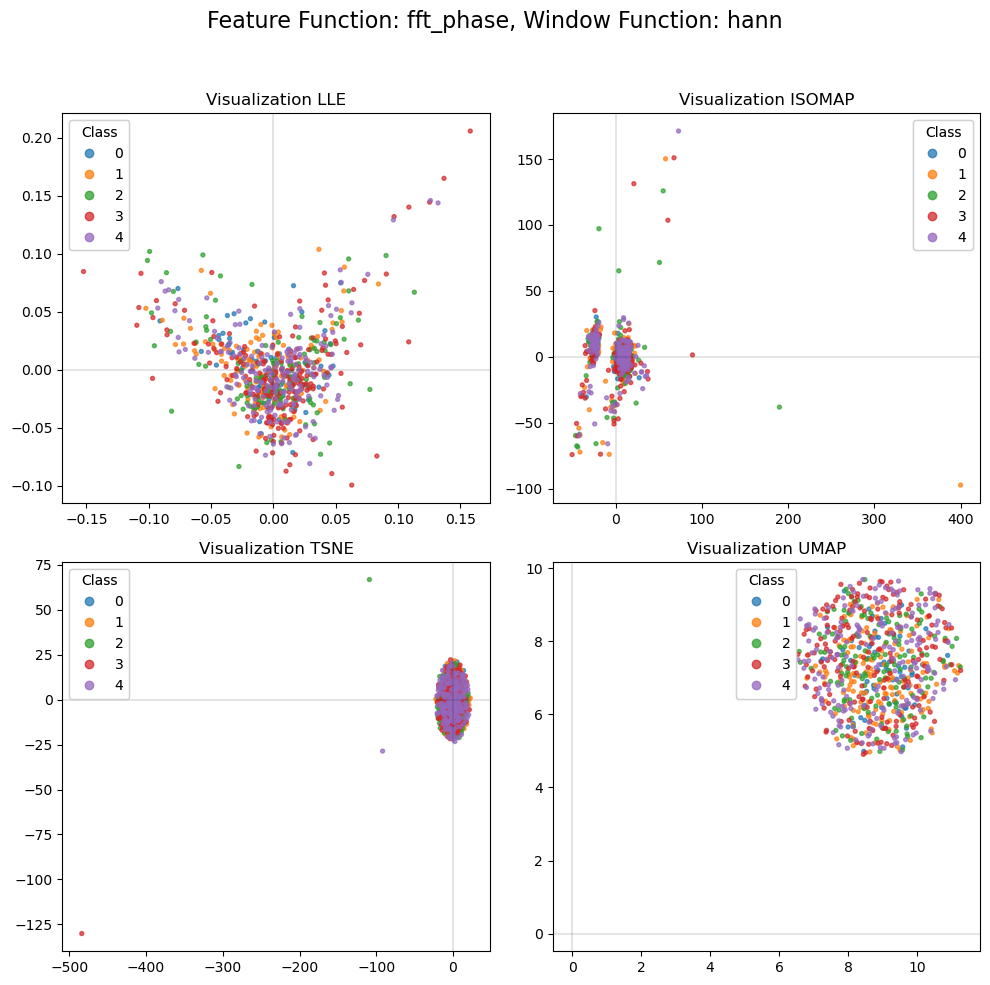

Loading into 336 windows of length 4096
Loading into 807 windows of length 4096
Loading into 692 windows of length 4096
Loading into 985 windows of length 4096
Loading into 955 windows of length 4096
Using fft_phase transform and a boxcar window.


/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


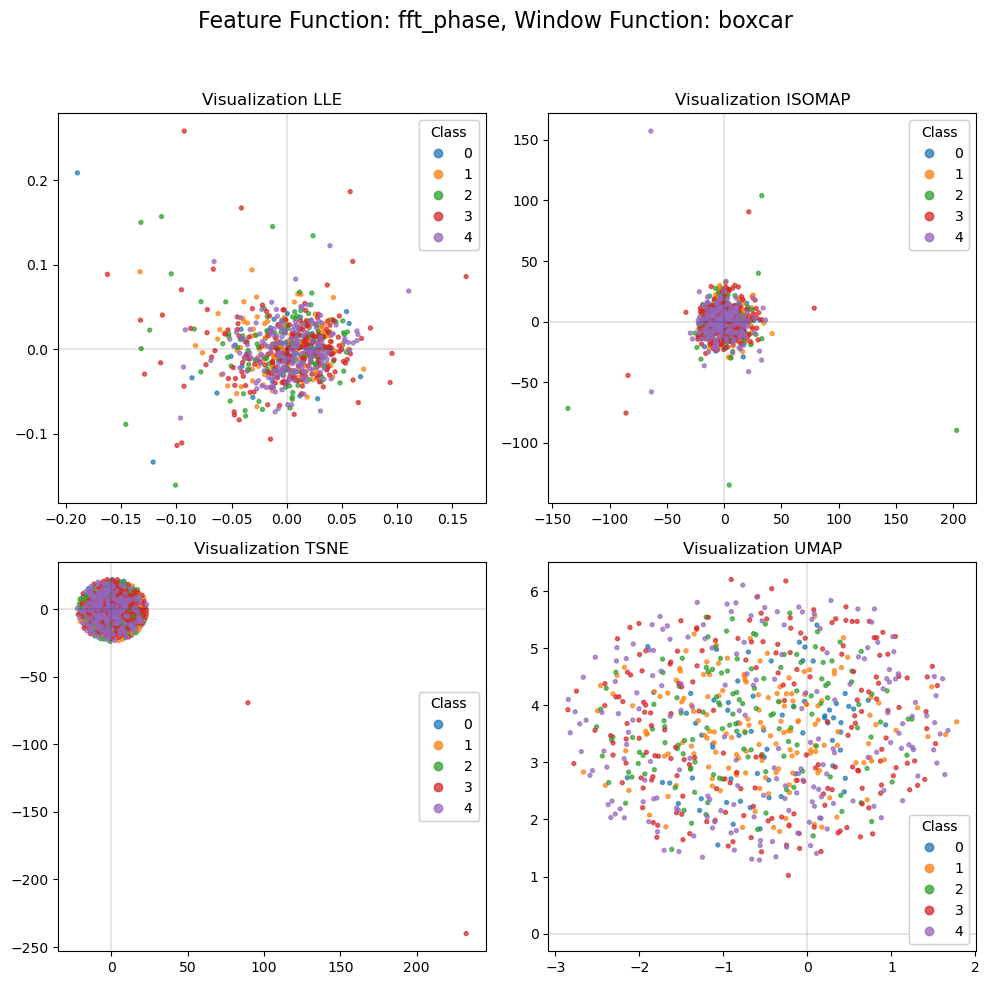

Loading into 336 windows of length 4096
Loading into 807 windows of length 4096
Loading into 692 windows of length 4096
Loading into 985 windows of length 4096
Loading into 955 windows of length 4096
Using fft_phase transform and a blackmanharris window.


/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


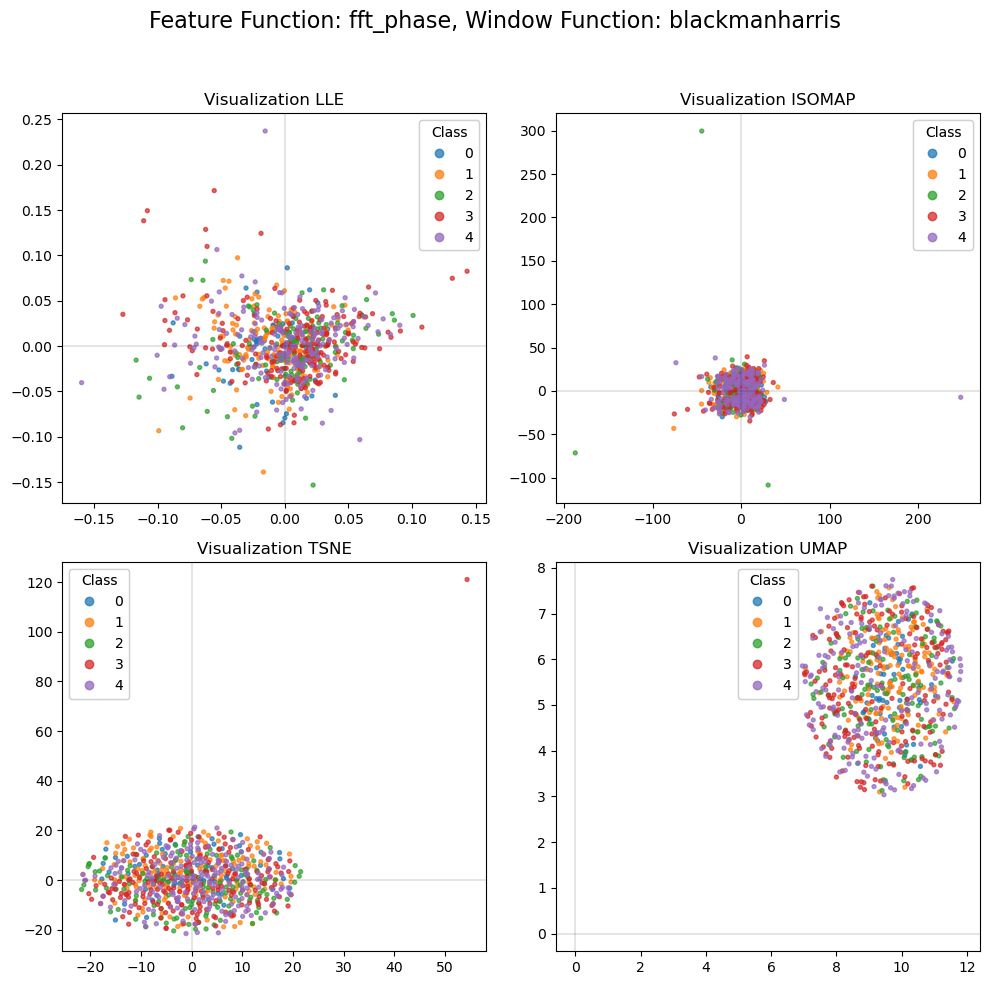

Loading into 336 windows of length 4096
Loading into 807 windows of length 4096
Loading into 692 windows of length 4096
Loading into 985 windows of length 4096
Loading into 955 windows of length 4096
Using dct_phase transform and a hamming window.


/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


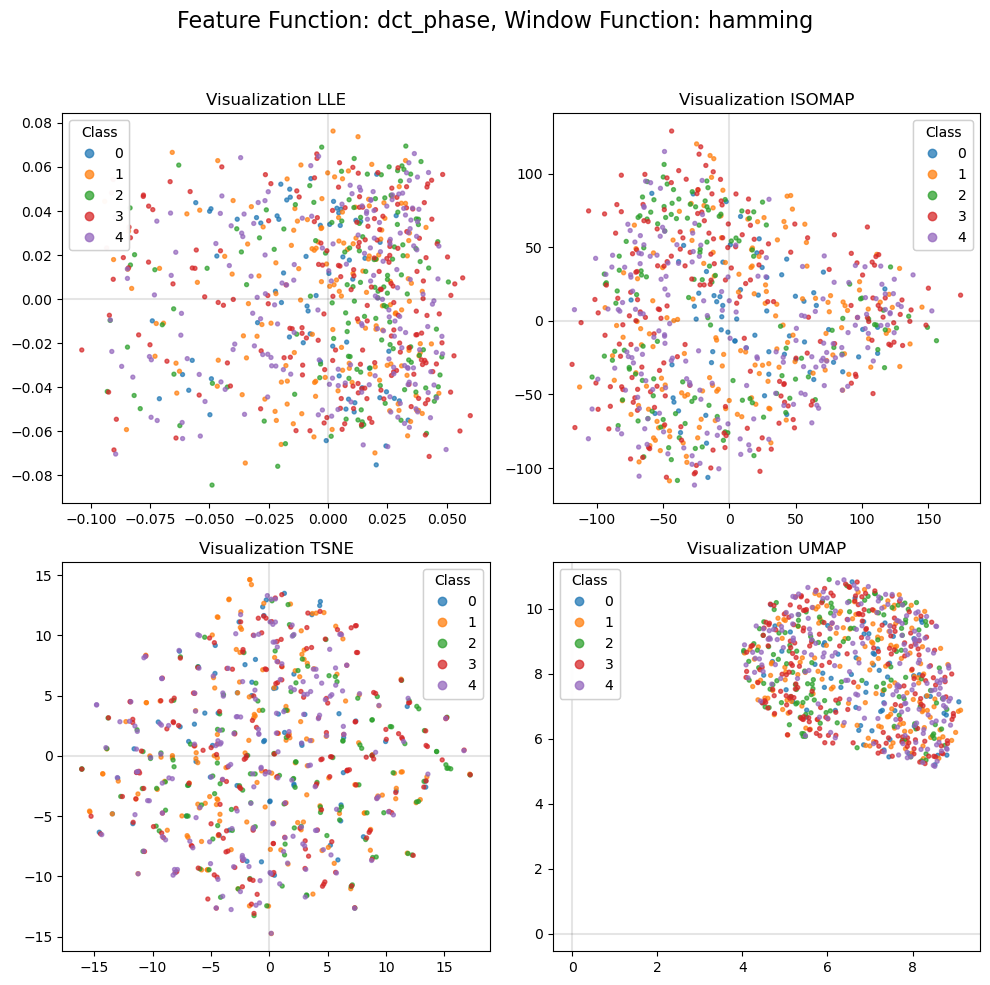

Loading into 336 windows of length 4096
Loading into 807 windows of length 4096
Loading into 692 windows of length 4096
Loading into 985 windows of length 4096
Loading into 955 windows of length 4096
Using dct_phase transform and a hann window.


/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


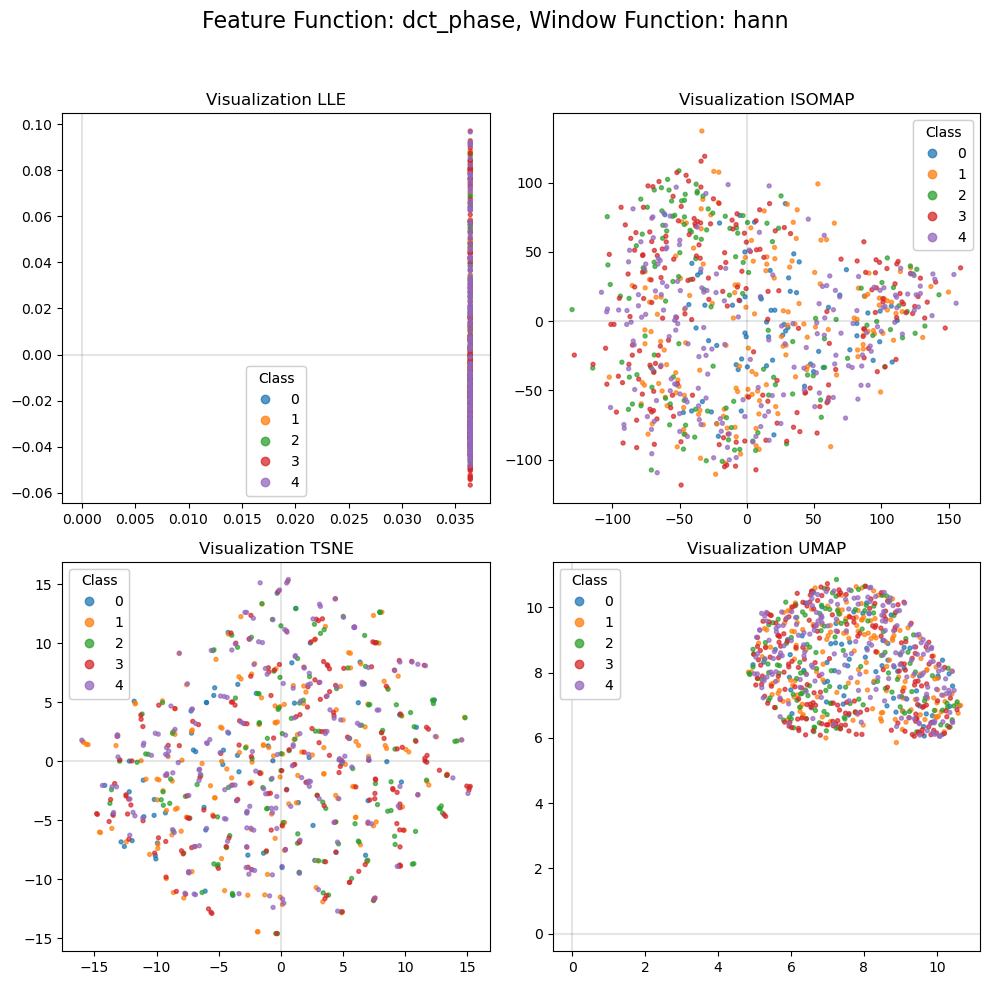

Loading into 336 windows of length 4096
Loading into 807 windows of length 4096
Loading into 692 windows of length 4096
Loading into 985 windows of length 4096
Loading into 955 windows of length 4096
Using dct_phase transform and a boxcar window.


/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


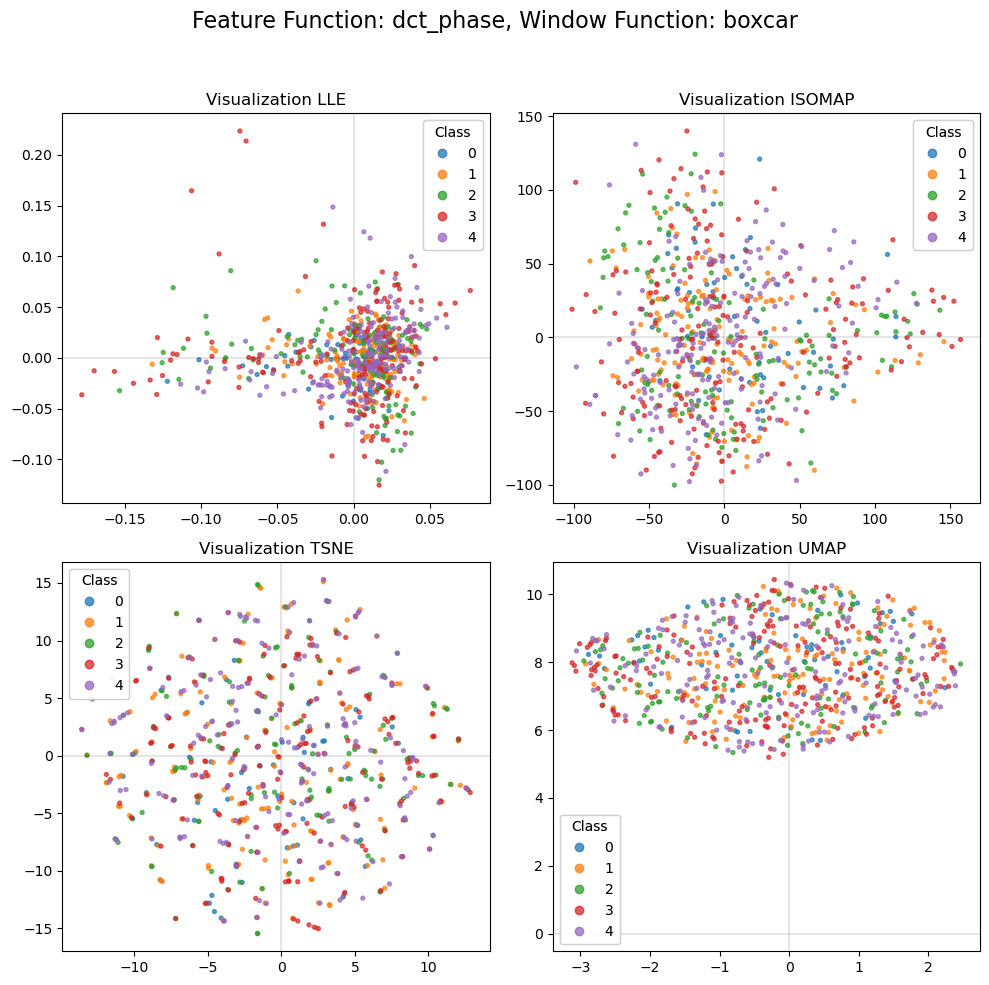

Loading into 336 windows of length 4096
Loading into 807 windows of length 4096
Loading into 692 windows of length 4096
Loading into 985 windows of length 4096
Loading into 955 windows of length 4096
Using dct_phase transform and a blackmanharris window.


/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


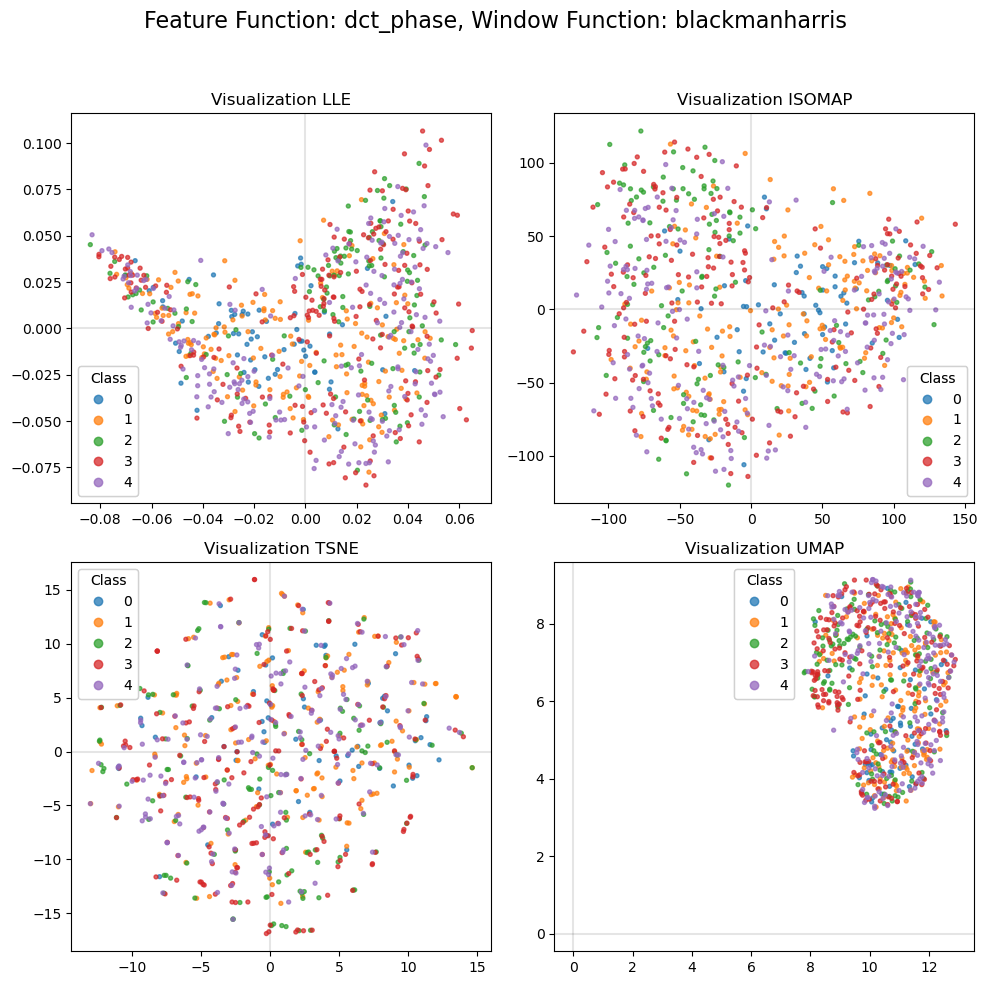

Loading into 336 windows of length 4096
Loading into 807 windows of length 4096
Loading into 692 windows of length 4096
Loading into 985 windows of length 4096
Loading into 955 windows of length 4096
Using cepstrum transform and a hamming window.


/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


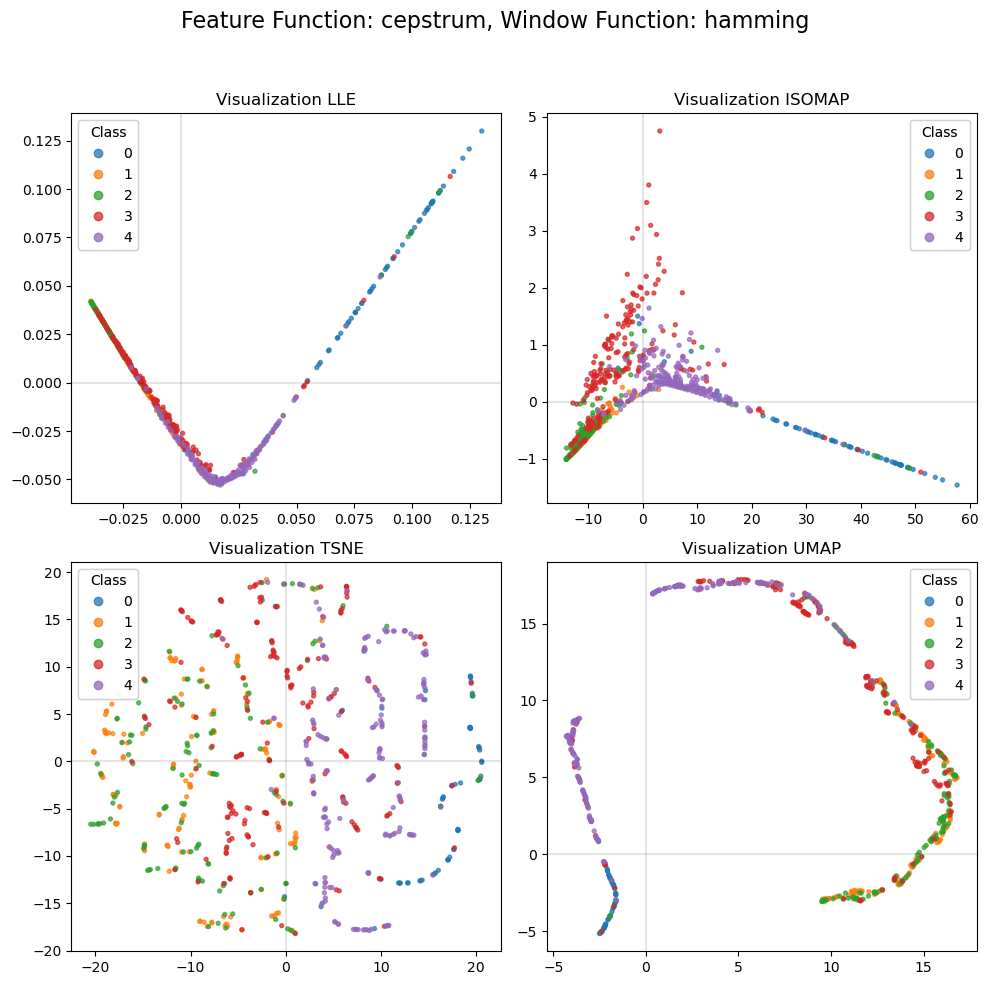

Loading into 336 windows of length 4096
Loading into 807 windows of length 4096
Loading into 692 windows of length 4096
Loading into 985 windows of length 4096
Loading into 955 windows of length 4096
Using cepstrum transform and a hann window.


/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


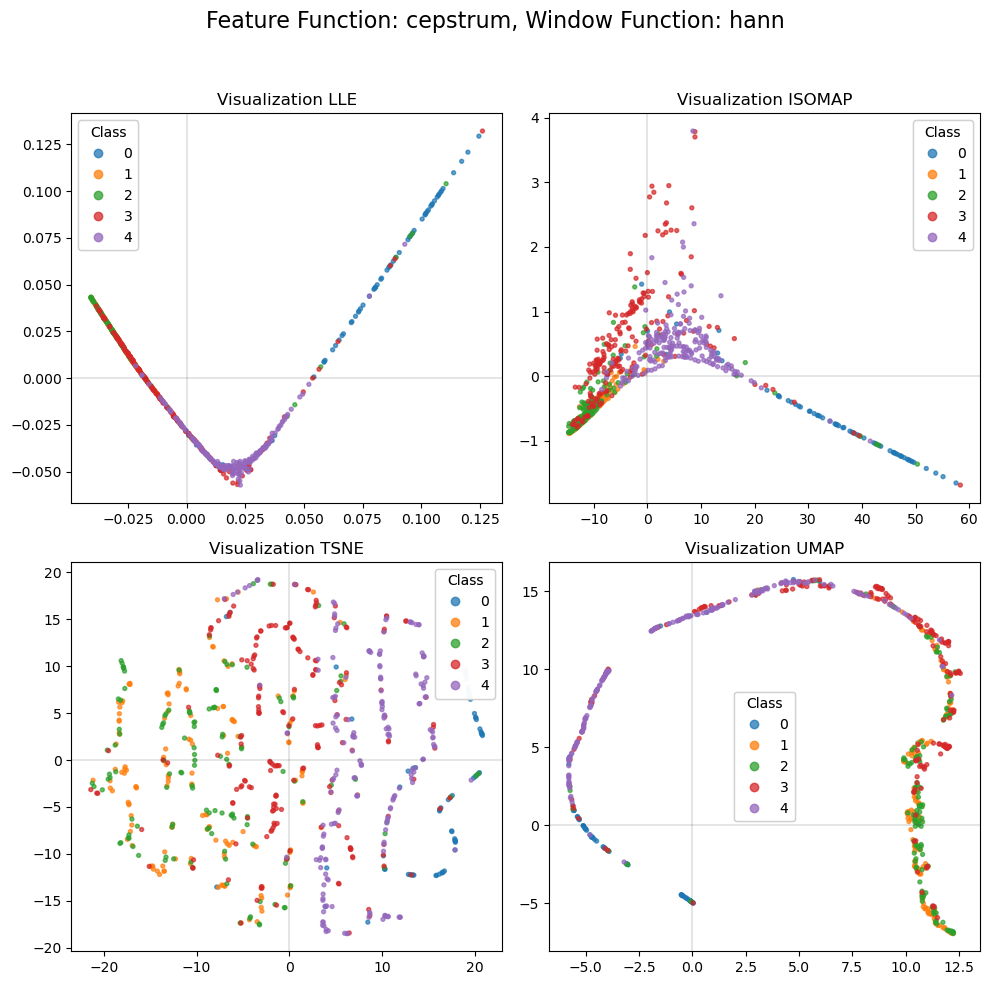

Loading into 336 windows of length 4096
Loading into 807 windows of length 4096
Loading into 692 windows of length 4096
Loading into 985 windows of length 4096
Loading into 955 windows of length 4096
Using cepstrum transform and a boxcar window.


/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


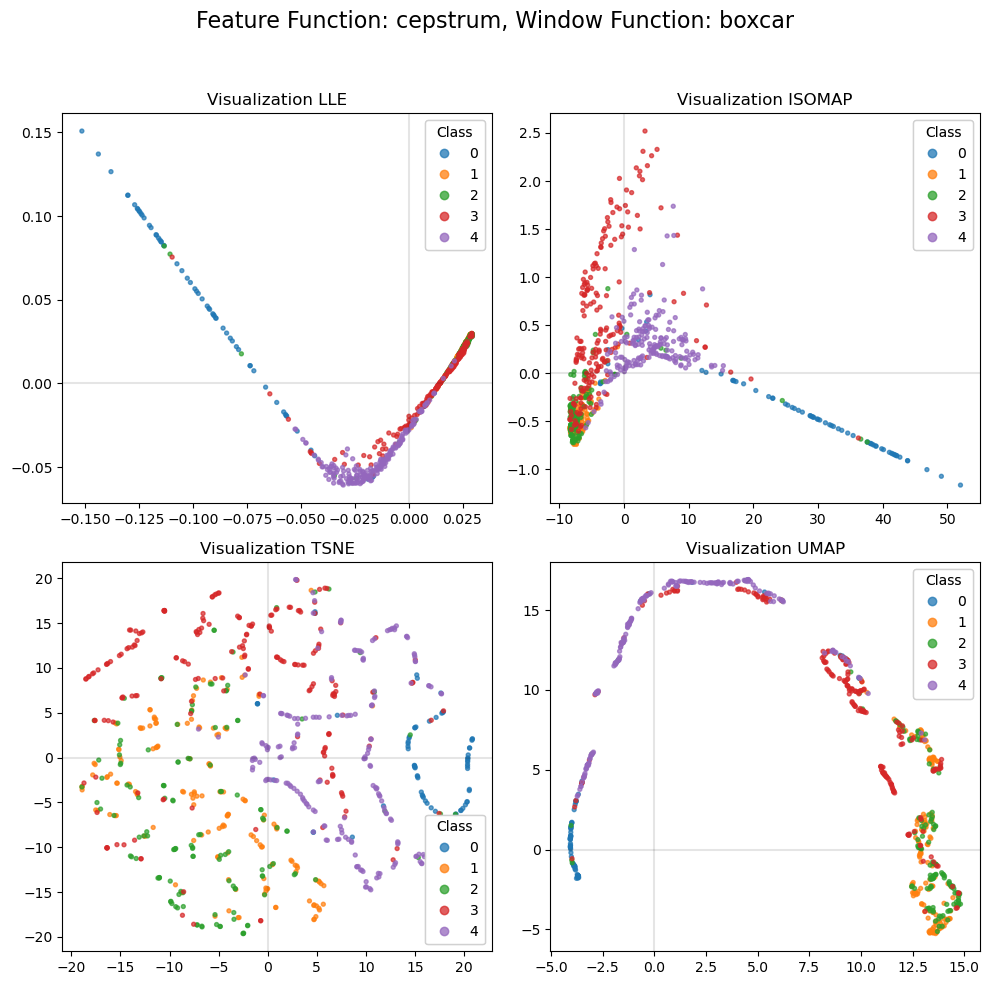

Loading into 336 windows of length 4096
Loading into 807 windows of length 4096
Loading into 692 windows of length 4096
Loading into 985 windows of length 4096
Loading into 955 windows of length 4096
Using cepstrum transform and a blackmanharris window.


/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


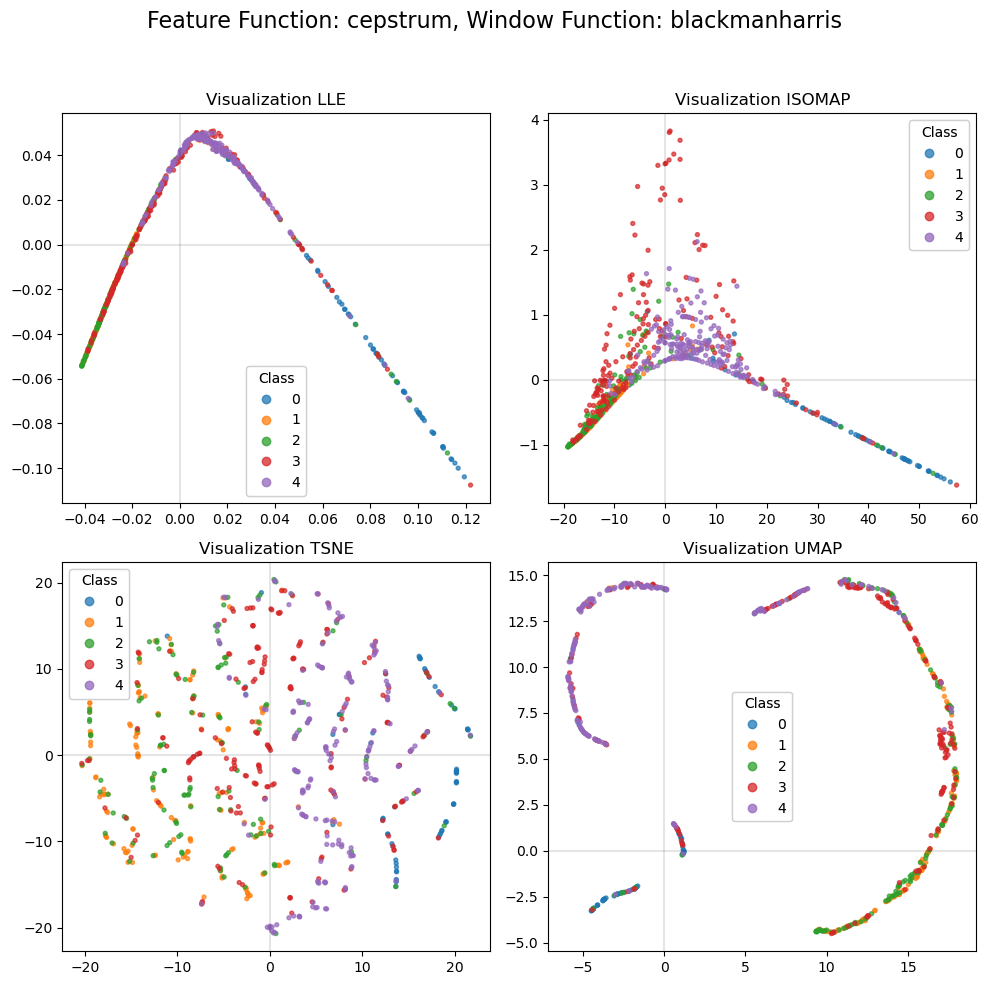

Loading into 336 windows of length 4096
Loading into 807 windows of length 4096
Loading into 692 windows of length 4096
Loading into 985 windows of length 4096
Loading into 955 windows of length 4096
Using raw transform and a hamming window.


/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


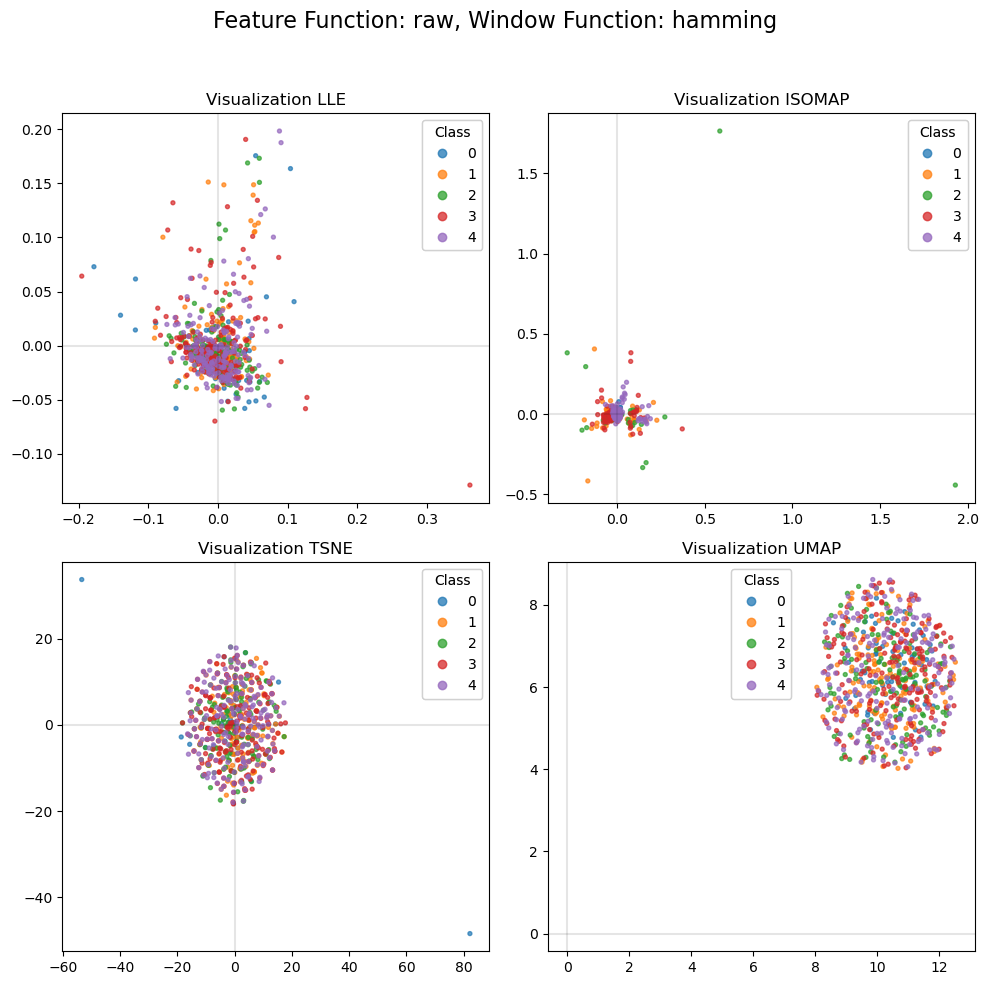

Loading into 336 windows of length 4096
Loading into 807 windows of length 4096
Loading into 692 windows of length 4096
Loading into 985 windows of length 4096
Loading into 955 windows of length 4096
Using raw transform and a hann window.


/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


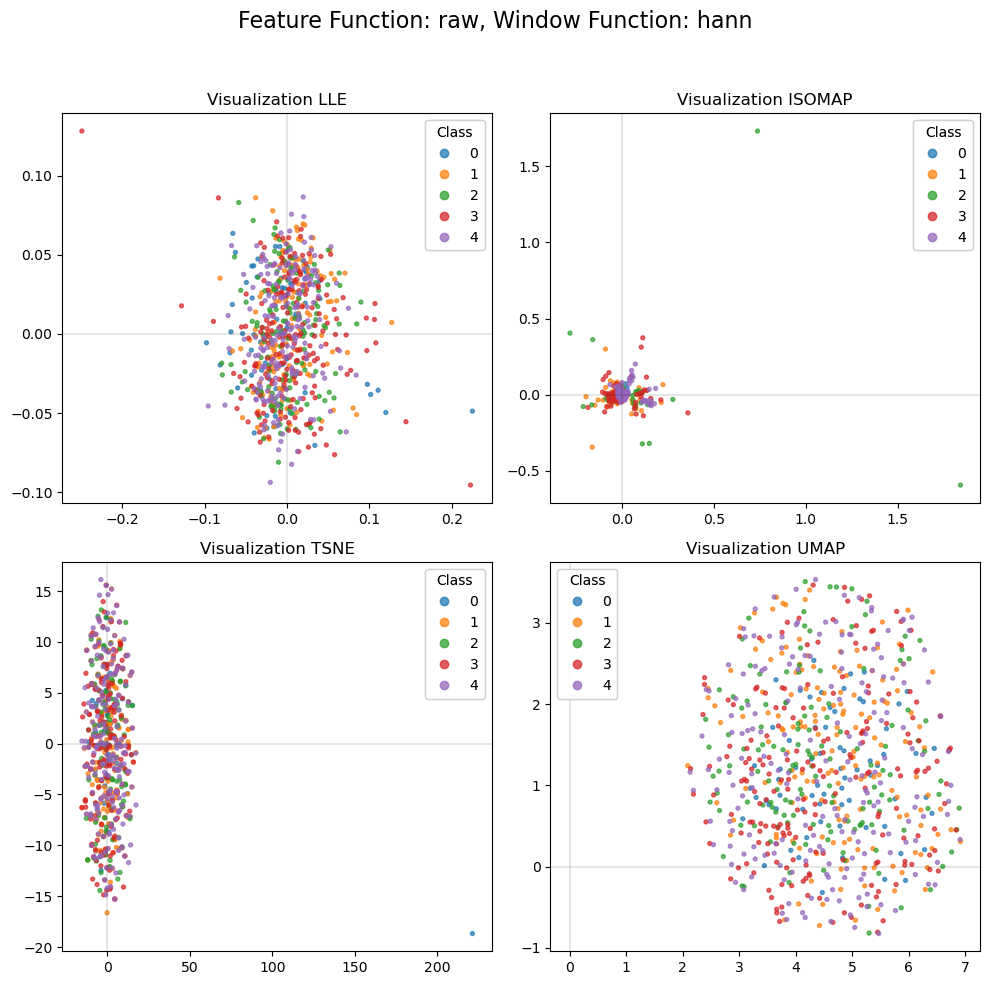

Loading into 336 windows of length 4096
Loading into 807 windows of length 4096
Loading into 692 windows of length 4096
Loading into 985 windows of length 4096
Loading into 955 windows of length 4096
Using raw transform and a boxcar window.


/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


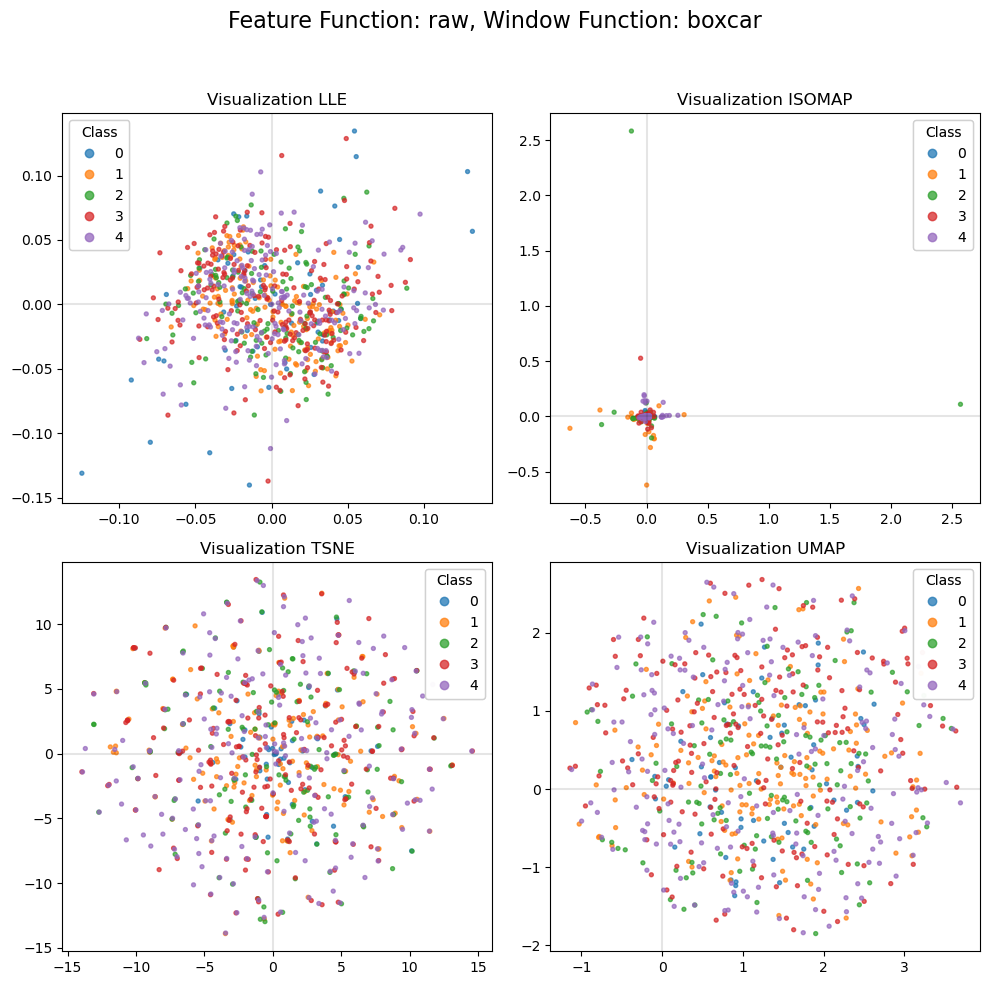

Loading into 336 windows of length 4096
Loading into 807 windows of length 4096
Loading into 692 windows of length 4096
Loading into 985 windows of length 4096
Loading into 955 windows of length 4096
Using raw transform and a blackmanharris window.


/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


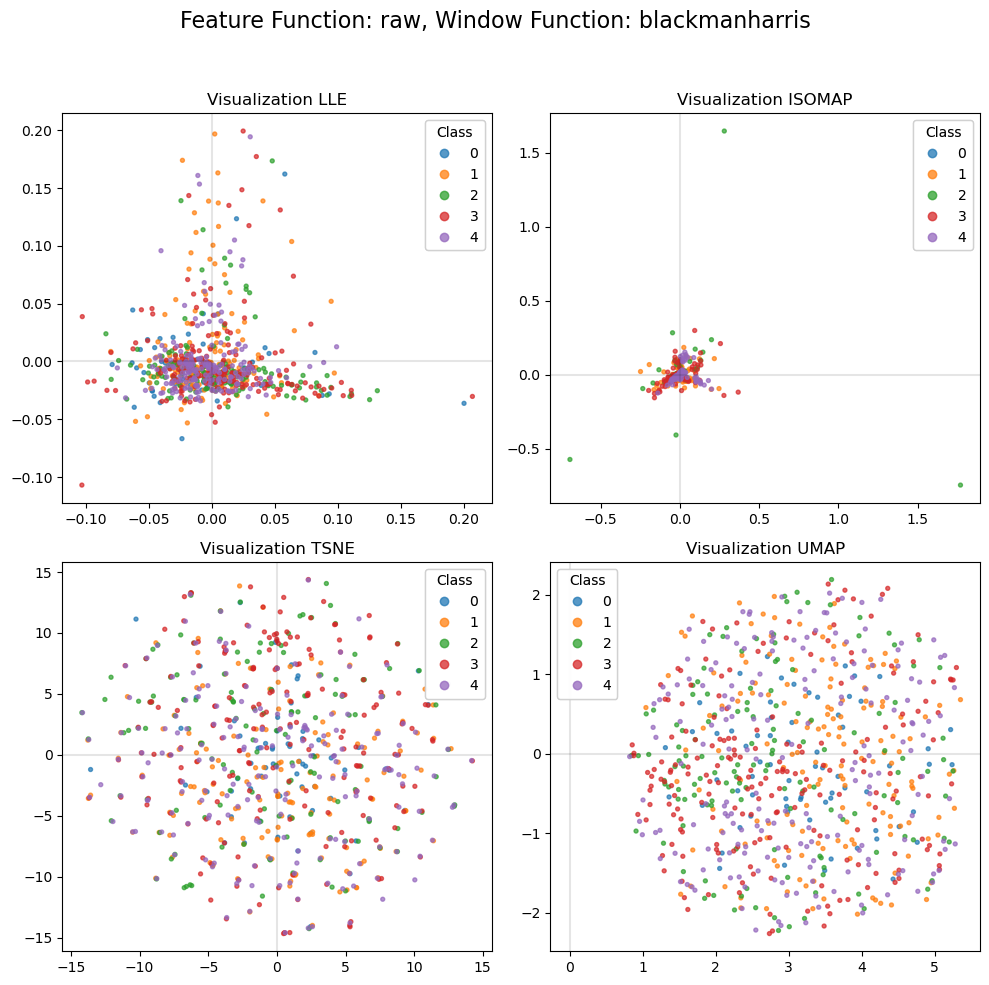

In [7]:
try_with_different_params(parameters)

# Testing the parameters

In the following part of the code, we test every combination to get the model accuracy score

In [8]:

def test_classifiers(parameters):
    feature_fns = ['dct', 'fft', 'fft_phase', 'dct_phase', 'cepstrum', 'raw']
    window_fns = ['hamming', 'hann', 'boxcar', 'blackmanharris']

    for f in feature_fns:

        for w in window_fns:
            parameters["window_fn"] = w
            parameters["feature_fn"] = f                        
            X, y = audio_task.load_data(parameters)
            classifier = audio_task.knn_fit(X, y)
            audio_task.run_secret_test(classifier, parameters)
            for i in range(5):
                audio_task.plot_test(classifier, parameters, f"data/challenge_test_{i}")

Loading into 336 windows of length 4096
Loading into 807 windows of length 4096
Loading into 692 windows of length 4096
Loading into 985 windows of length 4096
Loading into 955 windows of length 4096
Using dct transform and a hamming window.
Loading into 762 windows of length 4096
Predicting...


/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/an

Loading into 229 windows of length 4096
Predicting...
Loading into 130 windows of length 4096
Predicting...
Loading into 679 windows of length 4096
Predicting...
Loading into 16 windows of length 4096
Predicting...
Loading into 265 windows of length 4096
Predicting...


/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is

Loading into 182 windows of length 4096
Predicting...
Loading into 574 windows of length 4096
Predicting...
*** Total score: 70.25 ***
Testing with data/challenge_test_0
Loading into 292 windows of length 4096
Predicting...
Prediction accuracy 0.678
Confusion matrix
[[491   0   0   0   0]
 [105  71  81  14  57]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [ 60   0   0   0 104]]

Testing with data/challenge_test_1
Loading into 460 windows of length 4096
Predicting...
Prediction accuracy 0.202
Confusion matrix
[[ 52  22   7 232 145]
 [  0   0   0   0   0]
 [ 36  34  20 115 100]
 [  7 122 135 156  36]
 [ 72   0   0 153  79]]

Testing with data/challenge_test_2
Loading into 200 windows of length 4096
Predicting...
Prediction accuracy 0.824
Confusion matrix
[[  0   0   0]
 [ 14  40  61]
 [ 46   0 528]]

Testing with data/challenge_test_3
Loading into 428 windows of length 4096
Predicting...
Prediction accuracy 0.756
Confusion matrix
[[471   0   0   3   0]
 [ 69 142  95  36 131]
 [  0   0 

/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/an

Loading into 229 windows of length 4096
Predicting...
Loading into 130 windows of length 4096
Predicting...
Loading into 679 windows of length 4096
Predicting...
Loading into 16 windows of length 4096
Predicting...
Loading into 265 windows of length 4096
Predicting...


/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is

Loading into 182 windows of length 4096
Predicting...
Loading into 574 windows of length 4096
Predicting...
*** Total score: 69.68 ***
Testing with data/challenge_test_0
Loading into 292 windows of length 4096
Predicting...
Prediction accuracy 0.655
Confusion matrix
[[484   0   0   7   0]
 [100  55  89  10  74]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [ 59   0   0   0 105]]

Testing with data/challenge_test_1
Loading into 460 windows of length 4096
Predicting...
Prediction accuracy 0.197
Confusion matrix
[[ 39  30  10 235 144]
 [  0   0   0   0   0]
 [ 26  34  23 115 107]
 [ 16 120 131 156  33]
 [ 72   0   0 150  82]]

Testing with data/challenge_test_2
Loading into 200 windows of length 4096
Predicting...
Prediction accuracy 0.826
Confusion matrix
[[  0   0   0]
 [ 17  37  61]
 [ 42   0 532]]

Testing with data/challenge_test_3
Loading into 428 windows of length 4096
Predicting...
Prediction accuracy 0.745
Confusion matrix
[[471   0   0   3   0]
 [ 68 137 111  33 124]
 [  0   0 

/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/an

Loading into 229 windows of length 4096
Predicting...
Loading into 130 windows of length 4096
Predicting...
Loading into 679 windows of length 4096
Predicting...
Loading into 16 windows of length 4096
Predicting...
Loading into 265 windows of length 4096


/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is

Predicting...
Loading into 182 windows of length 4096
Predicting...
Loading into 574 windows of length 4096
Predicting...
*** Total score: 75.63 ***
Testing with data/challenge_test_0
Loading into 292 windows of length 4096
Predicting...
Prediction accuracy 0.662
Confusion matrix
[[491   0   0   0   0]
 [166  58  41  14  49]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [ 62   0   0   0 102]]

Testing with data/challenge_test_1
Loading into 460 windows of length 4096
Predicting...
Prediction accuracy 0.213
Confusion matrix
[[ 66  26   7 229 130]
 [  0   0   0   0   0]
 [  7  54  46 122  76]
 [  7 110 164 152  23]
 [ 88   0   0 156  60]]

Testing with data/challenge_test_2
Loading into 200 windows of length 4096
Predicting...
Prediction accuracy 0.810
Confusion matrix
[[  0   0   0   0]
 [ 11  27   0  77]
 [  0   0   0   0]
 [ 39   0   4 531]]

Testing with data/challenge_test_3
Loading into 428 windows of length 4096
Predicting...
Prediction accuracy 0.727
Confusion matrix
[[463   0  

/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/an

Loading into 229 windows of length 4096
Predicting...
Loading into 130 windows of length 4096
Predicting...
Loading into 679 windows of length 4096
Predicting...
Loading into 16 windows of length 4096
Predicting...
Loading into 265 windows of length 4096
Predicting...


/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/an

Loading into 182 windows of length 4096
Predicting...
Loading into 574 windows of length 4096
Predicting...
*** Total score: 68.92 ***
Testing with data/challenge_test_0
Loading into 292 windows of length 4096
Predicting...
Prediction accuracy 0.633
Confusion matrix
[[468   0  13  10   0]
 [ 74  44 107  14  89]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [ 54   0   0   0 110]]

Testing with data/challenge_test_1
Loading into 460 windows of length 4096
Predicting...
Prediction accuracy 0.199
Confusion matrix
[[ 42  15  14 232 155]
 [  0   0   0   0   0]
 [ 13  35  23 122 112]
 [  0  93 122 160  81]
 [ 80   0   0 146  78]]

Testing with data/challenge_test_2
Loading into 200 windows of length 4096
Predicting...
Prediction accuracy 0.785
Confusion matrix
[[  0   0   0   0   0]
 [ 21  33   0   0  61]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [ 52   0   3  11 508]]

Testing with data/challenge_test_3
Loading into 428 windows of length 4096
Predicting...
Prediction accuracy 0.761
Con

/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/an

Loading into 16 windows of length 4096
Predicting...
Loading into 265 windows of length 4096
Predicting...
Loading into 182 windows of length 4096
Predicting...
Loading into 574 windows of length 4096
Predicting...


/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is

*** Total score: 74.20 ***
Testing with data/challenge_test_0
Loading into 292 windows of length 4096
Predicting...
Prediction accuracy 0.640
Confusion matrix
[[470   0   0  21   0]
 [112  51 141  13  11]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [ 56   0   0   0 108]]

Testing with data/challenge_test_1
Loading into 460 windows of length 4096
Predicting...
Prediction accuracy 0.198
Confusion matrix
[[ 45  23  37 225 128]
 [  0   0   0   0   0]
 [ 44  57  16 115  73]
 [ 14 127 143 152  20]
 [ 63   0   0 153  88]]

Testing with data/challenge_test_2
Loading into 200 windows of length 4096
Predicting...
Prediction accuracy 0.837
Confusion matrix
[[  0   0   0   0]
 [  7  31  16  61]
 [  0   0   0   0]
 [ 28   0   0 546]]

Testing with data/challenge_test_3
Loading into 428 windows of length 4096
Predicting...
Prediction accuracy 0.804
Confusion matrix
[[468   0   0   6   0]
 [ 95 217 108  29  24]
 [  0   0   0   0   0]
 [ 14   0   0 456   3]
 [  0   0   0   0   0]]

Testing with dat

/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/an

Loading into 16 windows of length 4096
Predicting...
Loading into 265 windows of length 4096
Predicting...
Loading into 182 windows of length 4096
Predicting...
Loading into 574 windows of length 4096
Predicting...
*** Total score: 74.32 ***
Testing with data/challenge_test_0
Loading into 292 windows of length 4096
Predicting...


/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is

Prediction accuracy 0.606
Confusion matrix
[[458   0  12  17   4]
 [ 98  41 166  13  10]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [ 39   4  24   0  97]]

Testing with data/challenge_test_1
Loading into 460 windows of length 4096
Predicting...
Prediction accuracy 0.197
Confusion matrix
[[ 45  20  40 222 131]
 [  0   0   0   0   0]
 [ 41  64  12 115  73]
 [ 20 107 150 152  27]
 [ 63   0   0 150  91]]

Testing with data/challenge_test_2
Loading into 200 windows of length 4096
Predicting...
Prediction accuracy 0.837
Confusion matrix
[[  0   0   0   0]
 [ 11  31  16  57]
 [  0   0   0   0]
 [ 25   0   3 546]]

Testing with data/challenge_test_3
Loading into 428 windows of length 4096
Predicting...
Prediction accuracy 0.802
Confusion matrix
[[471   0   0   3   0]
 [ 86 211 111  29  36]
 [  0   0   0   0   0]
 [ 13   0   0 457   3]
 [  0   0   0   0   0]]

Testing with data/challenge_test_4
Loading into 285 windows of length 4096
Predicting...
Prediction accuracy 0.289
Confusion matrix


/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/an

Loading into 16 windows of length 4096
Predicting...
Loading into 265 windows of length 4096
Predicting...
Loading into 182 windows of length 4096
Predicting...
Loading into 574 windows of length 4096
Predicting...
*** Total score: 82.31 ***
Testing with data/challenge_test_0
Loading into 292 windows of length 4096
Predicting...
Prediction accuracy 0.725
Confusion matrix


/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/an

[[491   0   0   0   0]
 [ 95  97  75  27  34]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [ 33   0   6   0 125]]

Testing with data/challenge_test_1
Loading into 460 windows of length 4096
Predicting...
Prediction accuracy 0.238
Confusion matrix
[[ 52  37  30 225 114]
 [  0   0   0   0   0]
 [  0  83  57 122  43]
 [  6 173  95 152  30]
 [ 46   0   0 156 102]]

Testing with data/challenge_test_2
Loading into 200 windows of length 4096
Predicting...
Prediction accuracy 0.884
Confusion matrix
[[  0   0   0   0]
 [  0  49   9  57]
 [  0   0   0   0]
 [ 14   0   0 560]]

Testing with data/challenge_test_3
Loading into 428 windows of length 4096
Predicting...
Prediction accuracy 0.796
Confusion matrix
[[460   0   2   9   3]
 [110 200 140  17   6]
 [  0   0   0   0   0]
 [  0   0   3 470   0]
 [  0   0   0   0   0]]

Testing with data/challenge_test_4
Loading into 285 windows of length 4096
Predicting...
Prediction accuracy 0.301
Confusion matrix
[[  0   0   0   0   0]
 [  0   0   0   0   

/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/an

Loading into 679 windows of length 4096
Predicting...
Loading into 16 windows of length 4096
Predicting...
Loading into 265 windows of length 4096
Predicting...
Loading into 182 windows of length 4096
Predicting...
Loading into 574 windows of length 4096


/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is

Predicting...
*** Total score: 74.43 ***
Testing with data/challenge_test_0
Loading into 292 windows of length 4096
Predicting...
Prediction accuracy 0.573
Confusion matrix
[[445   0  35   7   4]
 [ 86  33 177  13  19]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [ 38   6  35   0  85]]

Testing with data/challenge_test_1
Loading into 460 windows of length 4096
Predicting...
Prediction accuracy 0.199
Confusion matrix
[[ 36  15  58 228 121]
 [  0   0   0   0   0]
 [ 20  54  27 115  89]
 [  4  80 142 152  78]
 [ 70   0   0 146  88]]

Testing with data/challenge_test_2
Loading into 200 windows of length 4096
Predicting...
Prediction accuracy 0.792
Confusion matrix
[[  0   0   0   0   0]
 [ 17  20  24   0  54]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [ 31   0  13   4 526]]

Testing with data/challenge_test_3
Loading into 428 windows of length 4096
Predicting...
Prediction accuracy 0.780
Confusion matrix
[[451   0  23   0   0]
 [ 43 196 136  39  59]
 [  0   0   0   0   0]
 [  6   0  

/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/an

Predicting...
Loading into 16 windows of length 4096
Predicting...
Loading into 265 windows of length 4096
Predicting...
Loading into 182 windows of length 4096
Predicting...


/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/an

Loading into 574 windows of length 4096
Predicting...
*** Total score: 54.39 ***
Testing with data/challenge_test_0
Loading into 292 windows of length 4096


/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Predicting...
Prediction accuracy 0.000
Confusion matrix
[[  0   0  47 444   0]
 [  0   0  27 301   0]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [  0   0  20 144   0]]

Testing with data/challenge_test_1
Loading into 460 windows of length 4096
Predicting...
Prediction accuracy 0.297
Confusion matrix
[[  0   0  37 417   4]
 [  0   0   0   0   0]
 [  0   0  32 273   0]
 [  0   3  37 416   0]
 [  0   0  19 281   4]]

Testing with data/challenge_test_2
Loading into 200 windows of length 4096
Predicting...
Prediction accuracy 0.010
Confusion matrix
[[  3  18  94   0]
 [  0   0   0   0]
 [  0   0   0   0]
 [  0  40 530   4]]

Testing with data/challenge_test_3
Loading into 428 windows of length 4096
Predicting...
Prediction accuracy 0.306
Confusion matrix
[[  0   0  46 422   6]
 [  0   0  32 441   0]
 [  0   0   0   0   0]
 [  0   0  31 434   8]
 [  0   0   0   0   0]]

Testing with data/challenge_test_4
Loading into 285 windows of length 4096
Predicting...
Prediction accuracy 0.084
Con

/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/an

Loading into 229 windows of length 4096
Predicting...
Loading into 130 windows of length 4096
Predicting...
Loading into 679 windows of length 4096
Predicting...
Loading into 16 windows of length 4096
Predicting...
Loading into 265 windows of length 4096
Predicting...
Loading into 182 windows of length 4096
Predicting...


/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/an

Loading into 574 windows of length 4096
Predicting...
*** Total score: 54.22 ***
Testing with data/challenge_test_0
Loading into 292 windows of length 4096
Predicting...


/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Prediction accuracy 0.000
Confusion matrix
[[  0   0  35 456   0]
 [  0   0  28 293   7]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [  0   4  15 145   0]]

Testing with data/challenge_test_1
Loading into 460 windows of length 4096
Predicting...
Prediction accuracy 0.302
Confusion matrix
[[  0   3  32 416   7]
 [  0   0   0   0   0]
 [  0   6  23 276   0]
 [  0   0  25 431   0]
 [  4   7  17 270   6]]

Testing with data/challenge_test_2
Loading into 200 windows of length 4096
Predicting...
Prediction accuracy 0.012
Confusion matrix
[[  0   3 112   0]
 [  0   0   0   0]
 [  0   0   0   0]
 [  0  50 516   8]]

Testing with data/challenge_test_3
Loading into 428 windows of length 4096
Predicting...
Prediction accuracy 0.289
Confusion matrix
[[  0   3  43 412  16]
 [  0   0  34 430   9]
 [  0   0   0   0   0]
 [  0   3  52 410   8]
 [  0   0   0   0   0]]

Testing with data/challenge_test_4
Loading into 285 windows of length 4096
Predicting...
Prediction accuracy 0.093
Confusion matrix


/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(

Loading into 229 windows of length 4096
Predicting...
Loading into 130 windows of length 4096
Predicting...
Loading into 679 windows of length 4096
Predicting...
Loading into 16 windows of length 4096
Predicting...
Loading into 265 windows of length 4096
Predicting...
Loading into 182 windows of length 4096
Predicting...


/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(

Loading into 574 windows of length 4096
Predicting...
*** Total score: 53.90 ***
Testing with data/challenge_test_0
Loading into 292 windows of length 4096
Predicting...


/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is

Prediction accuracy 0.000
Confusion matrix
[[  0   0 491   0]
 [  0   0 328   0]
 [  0   0   0   0]
 [  0   0 164   0]]

Testing with data/challenge_test_1
Loading into 460 windows of length 4096
Predicting...
Prediction accuracy 0.301
Confusion matrix
[[  0   3 455   0]
 [  0   3 302   0]
 [  0   0 456   0]
 [  0   0 304   0]]

Testing with data/challenge_test_2
Loading into 200 windows of length 4096
Predicting...
Prediction accuracy 0.000
Confusion matrix
[[  0   3 112   0]
 [  0   0   0   0]
 [  0   0   0   0]
 [  0   7 567   0]]

Testing with data/challenge_test_3
Loading into 428 windows of length 4096
Predicting...
Prediction accuracy 0.329
Confusion matrix
[[  0   0   0 474]
 [  0   0   7 466]
 [  0   0   0   0]
 [  0   3   3 467]]

Testing with data/challenge_test_4
Loading into 285 windows of length 4096
Predicting...
Prediction accuracy 0.007
Confusion matrix
[[  7 954]
 [  0   0]]

Loading into 336 windows of length 4096
Loading into 807 windows of length 4096
Loading into 

/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/an

Predicting...
Loading into 130 windows of length 4096
Predicting...
Loading into 679 windows of length 4096
Predicting...


/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/an

Loading into 16 windows of length 4096
Predicting...
Loading into 265 windows of length 4096
Predicting...
Loading into 182 windows of length 4096
Predicting...
Loading into 574 windows of length 4096
Predicting...
*** Total score: 54.37 ***
Testing with data/challenge_test_0
Loading into 292 windows of length 4096
Predicting...


/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Prediction accuracy 0.003
Confusion matrix
[[  0   4  12 463  12]
 [  0   3  28 291   6]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [  0   0  14 150   0]]

Testing with data/challenge_test_1
Loading into 460 windows of length 4096
Predicting...
Prediction accuracy 0.278
Confusion matrix
[[  0   0  26 419  13]
 [  0   0   0   0   0]
 [  0   3  19 280   3]
 [  0   0  46 395  15]
 [  0   0  34 261   9]]

Testing with data/challenge_test_2
Loading into 200 windows of length 4096
Predicting...
Prediction accuracy 0.030
Confusion matrix
[[  0   6 109   0]
 [  0   0   0   0]
 [  0   0   0   0]
 [  3  47 503  21]]

Testing with data/challenge_test_3
Loading into 428 windows of length 4096
Predicting...
Prediction accuracy 0.313
Confusion matrix
[[  0  11  23 437   3]
 [  0  13  44 409   7]
 [  0   0   0   0   0]
 [  0   4  22 432  15]
 [  0   0   0   0   0]]

Testing with data/challenge_test_4
Loading into 285 windows of length 4096
Predicting...
Prediction accuracy 0.085
Confusion matrix


/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/an

Loading into 16 windows of length 4096
Predicting...
Loading into 265 windows of length 4096
Predicting...
Loading into 182 windows of length 4096
Predicting...
Loading into 574 windows of length 4096
Predicting...


/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is

*** Total score: 63.31 ***
Testing with data/challenge_test_0
Loading into 292 windows of length 4096
Predicting...
Prediction accuracy 0.175
Confusion matrix
[[ 27 115  91 198  60]
 [  9  85 130  72  32]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [  0  26  38  40  60]]

Testing with data/challenge_test_1
Loading into 460 windows of length 4096
Predicting...
Prediction accuracy 0.260
Confusion matrix
[[ 11  59  80 202 106]
 [  0   0   0   0   0]
 [  0  66  84 100  55]
 [  0  54 117 236  49]
 [ 35  38  65 101  65]]

Testing with data/challenge_test_2
Loading into 200 windows of length 4096
Predicting...
Prediction accuracy 0.158
Confusion matrix
[[  0   0   0   0   0]
 [  0  28  27  54   6]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [  3  73 168 249  81]]

Testing with data/challenge_test_3
Loading into 428 windows of length 4096
Predicting...
Prediction accuracy 0.270
Confusion matrix
[[ 19 147  52 144 112]
 [ 10 134 121 140  68]
 [  0   0   0   0   0]
 [ 13  60 108 231  61]
 [

/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/an

Predicting...
Loading into 16 windows of length 4096
Predicting...
Loading into 265 windows of length 4096
Predicting...
Loading into 182 windows of length 4096
Predicting...
Loading into 574 windows of length 4096


/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/an

Predicting...
*** Total score: 64.13 ***
Testing with data/challenge_test_0
Loading into 292 windows of length 4096
Predicting...
Prediction accuracy 0.157
Confusion matrix
[[ 10 118  96 200  67]
 [ 14  85 128  75  26]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [  0  45  24  36  59]]

Testing with data/challenge_test_1
Loading into 460 windows of length 4096
Predicting...
Prediction accuracy 0.240
Confusion matrix
[[  8  58  91 207  94]
 [  0   0   0   0   0]
 [  3  59  55 140  48]
 [  0  49 104 249  54]
 [ 33  54  71  93  53]]

Testing with data/challenge_test_2
Loading into 200 windows of length 4096
Predicting...
Prediction accuracy 0.167
Confusion matrix
[[  0   0   0   0   0]
 [  0  24  28  59   4]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [  3  56 161 263  91]]

Testing with data/challenge_test_3
Loading into 428 windows of length 4096
Predicting...
Prediction accuracy 0.236
Confusion matrix
[[ 21  99  50 144 160]
 [ 15  99 149 139  71]
 [  0   0   0   0   0]
 [ 19  61 1

/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/an

Predicting...
Loading into 679 windows of length 4096
Predicting...
Loading into 16 windows of length 4096
Predicting...
Loading into 265 windows of length 4096
Predicting...
Loading into 182 windows of length 4096


/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/an

Predicting...
Loading into 574 windows of length 4096
Predicting...
*** Total score: 62.95 ***
Testing with data/challenge_test_0
Loading into 292 windows of length 4096
Predicting...
Prediction accuracy 0.114
Confusion matrix
[[ 13 172  76 182  48]
 [ 19  64 111  98  36]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [  6  45  36  42  35]]

Testing with data/challenge_test_1
Loading into 460 windows of length 4096
Predicting...
Prediction accuracy 0.228
Confusion matrix
[[ 11  48  79 161 159]
 [  0   0   0   0   0]
 [  7  87  78  95  38]
 [ 10 104  71 234  37]
 [ 64  57  56 102  25]]

Testing with data/challenge_test_2
Loading into 200 windows of length 4096
Predicting...
Prediction accuracy 0.183
Confusion matrix
[[  0   0   0   0   0]
 [  4  30  23  48  10]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [ 25  76 102 275  96]]

Testing with data/challenge_test_3
Loading into 428 windows of length 4096
Predicting...
Prediction accuracy 0.246
Confusion matrix
[[ 10 125  73 150 116]
 [ 

/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/an

Loading into 229 windows of length 4096
Predicting...
Loading into 130 windows of length 4096
Predicting...
Loading into 679 windows of length 4096
Predicting...


/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/an

Loading into 16 windows of length 4096
Predicting...
Loading into 265 windows of length 4096
Predicting...
Loading into 182 windows of length 4096
Predicting...
Loading into 574 windows of length 4096
Predicting...
*** Total score: 64.03 ***
Testing with data/challenge_test_0
Loading into 292 windows of length 4096
Predicting...
Prediction accuracy 0.189
Confusion matrix
[[ 35 162  75 136  83]
 [ 17  71 121  86  33]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [  0  30  25  29  80]]

Testing with data/challenge_test_1
Loading into 460 windows of length 4096
Predicting...
Prediction accuracy 0.242
Confusion matrix
[[ 13  62  93 161 129]
 [  0   0   0   0   0]
 [  3  47  61 120  74]
 [  0  24 142 206  84]
 [ 10  57  62  87  88]]

Testing with data/challenge_test_2
Loading into 200 windows of length 4096
Predicting...
Prediction accuracy 0.242
Confusion matrix
[[  0   0   0   0   0]
 [  0  37  18  56   4]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [  4  59 169 212 130]]

Testing wit

/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/an

Loading into 130 windows of length 4096
Predicting...
Loading into 679 windows of length 4096
Predicting...
Loading into 16 windows of length 4096
Predicting...


/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/an

Loading into 265 windows of length 4096
Predicting...
Loading into 182 windows of length 4096
Predicting...
Loading into 574 windows of length 4096
Predicting...


/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


*** Total score: 80.02 ***
Testing with data/challenge_test_0
Loading into 292 windows of length 4096
Predicting...
Prediction accuracy 0.776
Confusion matrix
[[480   0  11   0   0]
 [ 58 182  55  23  10]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [ 25  16  22   0 101]]

Testing with data/challenge_test_1
Loading into 460 windows of length 4096
Predicting...
Prediction accuracy 0.273
Confusion matrix
[[ 32  34  43 219 130]
 [  0   0   0   0   0]
 [ 10  65 114  69  47]
 [  0 147 148 161   0]
 [ 53   0  14 128 109]]

Testing with data/challenge_test_2
Loading into 200 windows of length 4096
Predicting...
Prediction accuracy 0.824
Confusion matrix
[[  0   0   0   0   0]
 [  3  43   4  15  50]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [  7   0   7  35 525]]

Testing with data/challenge_test_3
Loading into 428 windows of length 4096
Predicting...
Prediction accuracy 0.847
Confusion matrix
[[461   0   5   3   5]
 [  0 368  65  26  14]
 [  0   0   0   0   0]
 [  0  39  56 374   4]
 [

/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/an

Predicting...
Loading into 679 windows of length 4096
Predicting...
Loading into 16 windows of length 4096
Predicting...
Loading into 265 windows of length 4096


/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/an

Predicting...
Loading into 182 windows of length 4096
Predicting...
Loading into 574 windows of length 4096
Predicting...


/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


*** Total score: 80.51 ***
Testing with data/challenge_test_0
Loading into 292 windows of length 4096
Predicting...
Prediction accuracy 0.764
Confusion matrix
[[478   0  13   0   0]
 [ 61 176  64  14  13]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [ 29  20  15   3  97]]

Testing with data/challenge_test_1
Loading into 460 windows of length 4096
Predicting...
Prediction accuracy 0.271
Confusion matrix
[[ 35  37  30 238 118]
 [  0   0   0   0   0]
 [  3  63 107  92  40]
 [  0 120 161 168   7]
 [ 55   0  11 136 102]]

Testing with data/challenge_test_2
Loading into 200 windows of length 4096
Predicting...
Prediction accuracy 0.811
Confusion matrix
[[  0   0   0   0   0]
 [ 11  43   4   0  57]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [ 10   4  11  33 516]]

Testing with data/challenge_test_3
Loading into 428 windows of length 4096
Predicting...
Prediction accuracy 0.817
Confusion matrix
[[466   0   5   0   3]
 [  5 329  95  37   7]
 [  0   0   0   0   0]
 [  0  45  59 365   4]
 [

/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/an

Loading into 229 windows of length 4096
Predicting...
Loading into 130 windows of length 4096
Predicting...
Loading into 679 windows of length 4096
Predicting...


/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/an

Loading into 16 windows of length 4096
Predicting...
Loading into 265 windows of length 4096
Predicting...
Loading into 182 windows of length 4096
Predicting...
Loading into 574 windows of length 4096
Predicting...
*** Total score: 84.00 ***
Testing with data/challenge_test_0
Loading into 292 windows of length 4096
Predicting...
Prediction accuracy 0.660
Confusion matrix
[[423   0  54  14   0]
 [ 50 119 104  27  28]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [  7   8  16  26 107]]

Testing with data/challenge_test_1
Loading into 460 windows of length 4096
Predicting...


/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Prediction accuracy 0.227
Confusion matrix
[[ 25  16  39 230 148]
 [  0   0   0   0   0]
 [  0 117  46 122  20]
 [  0 144 129 183   0]
 [ 59   0   0 153  92]]

Testing with data/challenge_test_2
Loading into 200 windows of length 4096
Predicting...
Prediction accuracy 0.874
Confusion matrix
[[  0   0   0   0   0]
 [  0  45  16   0  54]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [  4   0   0  13 557]]

Testing with data/challenge_test_3
Loading into 428 windows of length 4096
Predicting...
Prediction accuracy 0.866
Confusion matrix
[[457   0   3   8   6]
 [  0 385  42  46   0]
 [  0   0   0   0   0]
 [  0   3  82 388   0]
 [  0   0   0   0   0]]

Testing with data/challenge_test_4
Loading into 285 windows of length 4096
Predicting...
Prediction accuracy 0.194
Confusion matrix
[[  0   0   0   0   0]
 [  0   0   0   0   0]
 [  3 515 186 157 100]
 [  0   0   0   0   0]
 [  0   0   0   0   0]]

Loading into 336 windows of length 4096
Loading into 807 windows of length 4096
Loading into 

/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/an

Predicting...
Loading into 679 windows of length 4096
Predicting...
Loading into 16 windows of length 4096
Predicting...
Loading into 265 windows of length 4096
Predicting...


/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/an

Loading into 182 windows of length 4096
Predicting...
Loading into 574 windows of length 4096
Predicting...
*** Total score: 78.27 ***
Testing with data/challenge_test_0
Loading into 292 windows of length 4096
Predicting...


/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Prediction accuracy 0.816
Confusion matrix
[[488   0   0   3   0]
 [ 61 214  25   3  25]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [ 22  24   7  11 100]]

Testing with data/challenge_test_1
Loading into 460 windows of length 4096
Predicting...
Prediction accuracy 0.247
Confusion matrix
[[ 37  32  41 221 127]
 [  0   0   0   0   0]
 [  0  72  84  77  72]
 [  4 112 119 150  71]
 [ 70   0   9 120 105]]

Testing with data/challenge_test_2
Loading into 200 windows of length 4096
Predicting...
Prediction accuracy 0.733
Confusion matrix
[[  0   0   0   0   0]
 [ 17  40   4   3  51]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [ 10   6  22  71 465]]

Testing with data/challenge_test_3
Loading into 428 windows of length 4096
Predicting...
Prediction accuracy 0.785
Confusion matrix
[[474   0   0   0   0]
 [  5 321  88  29  30]
 [  0   0   0   0   0]
 [  1  56  72 320  24]
 [  0   0   0   0   0]]

Testing with data/challenge_test_4
Loading into 285 windows of length 4096
Predicting...
Pred

/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is

Loading into 229 windows of length 4096
Predicting...
Loading into 130 windows of length 4096
Predicting...
Loading into 679 windows of length 4096
Predicting...
Loading into 16 windows of length 4096
Predicting...
Loading into 265 windows of length 4096
Predicting...
Loading into 182 windows of length 4096
Predicting...


/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is

Loading into 574 windows of length 4096
Predicting...
*** Total score: 37.70 ***
Testing with data/challenge_test_0
Loading into 292 windows of length 4096
Predicting...
Prediction accuracy 0.499
Confusion matrix
[[491   0   0]
 [264   0  64]
 [164   0   0]]

Testing with data/challenge_test_1
Loading into 460 windows of length 4096
Predicting...
Prediction accuracy 0.211
Confusion matrix
[[276   0  21 161]
 [167   0   0 138]
 [259   0   0 197]
 [258   0   0  46]]

Testing with data/challenge_test_2
Loading into 200 windows of length 4096
Predicting...
Prediction accuracy 0.000
Confusion matrix
[[  0   0   0]
 [101   0  14]
 [574   0   0]]

Testing with data/challenge_test_3
Loading into 428 windows of length 4096
Predicting...
Prediction accuracy 0.342
Confusion matrix
[[474   0   0   0]
 [326   0   0 147]
 [135   0  11 327]
 [  0   0   0   0]]

Testing with data/challenge_test_4
Loading into 285 windows of length 4096
Predicting...
Prediction accuracy 0.004
Confusion matrix
[[  0   0

/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is

Loading into 679 windows of length 4096
Predicting...
Loading into 16 windows of length 4096
Predicting...
Loading into 265 windows of length 4096
Predicting...
Loading into 182 windows of length 4096
Predicting...
Loading into 574 windows of length 4096
Predicting...
*** Total score: 38.07 ***
Testing with data/challenge_test_0
Loading into 292 windows of length 4096
Predicting...


/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(

Prediction accuracy 0.499
Confusion matrix
[[491   0   0]
 [258   0  70]
 [164   0   0]]

Testing with data/challenge_test_1
Loading into 460 windows of length 4096
Predicting...
Prediction accuracy 0.207
Confusion matrix
[[273   0  24 161]
 [161   0   4 140]
 [240   0   0 216]
 [258   0   3  43]]

Testing with data/challenge_test_2
Loading into 200 windows of length 4096
Predicting...
Prediction accuracy 0.000
Confusion matrix
[[  0   0   0]
 [101   0  14]
 [574   0   0]]

Testing with data/challenge_test_3
Loading into 428 windows of length 4096
Predicting...
Prediction accuracy 0.341
Confusion matrix
[[474   0   0   0   0]
 [316   0   0   0 157]
 [  0   0   0   0   0]
 [145   0   4  10 314]
 [  0   0   0   0   0]]

Testing with data/challenge_test_4
Loading into 285 windows of length 4096
Predicting...
Prediction accuracy 0.004
Confusion matrix
[[  0   0   0]
 [761   4 196]
 [  0   0   0]]

Loading into 336 windows of length 4096
Loading into 807 windows of length 4096
Loading into 

/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(

Loading into 16 windows of length 4096
Predicting...
Loading into 265 windows of length 4096
Predicting...
Loading into 182 windows of length 4096
Predicting...
Loading into 574 windows of length 4096
Predicting...
*** Total score: 34.63 ***
Testing with data/challenge_test_0
Loading into 292 windows of length 4096
Predicting...


/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is

Prediction accuracy 0.499
Confusion matrix
[[491   0   0]
 [318   0  10]
 [164   0   0]]

Testing with data/challenge_test_1
Loading into 460 windows of length 4096
Predicting...
Prediction accuracy 0.228
Confusion matrix
[[304   4   4 146]
 [226   0   4  75]
 [446   0   0  10]
 [261   0   0  43]]

Testing with data/challenge_test_2
Loading into 200 windows of length 4096
Predicting...
Prediction accuracy 0.000
Confusion matrix
[[  0   0   0]
 [115   0   0]
 [574   0   0]]

Testing with data/challenge_test_3
Loading into 428 windows of length 4096
Predicting...
Prediction accuracy 0.341
Confusion matrix
[[474   0   0   0]
 [406   0   0  67]
 [263   0  10 200]
 [  0   0   0   0]]

Testing with data/challenge_test_4
Loading into 285 windows of length 4096
Predicting...
Prediction accuracy 0.000
Confusion matrix
[[  0   0   0]
 [954   0   7]
 [  0   0   0]]

Loading into 336 windows of length 4096
Loading into 807 windows of length 4096
Loading into 692 windows of length 4096
Loading into

/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(

Loading into 229 windows of length 4096
Predicting...
Loading into 130 windows of length 4096
Predicting...
Loading into 679 windows of length 4096
Predicting...
Loading into 16 windows of length 4096
Predicting...
Loading into 265 windows of length 4096
Predicting...
Loading into 182 windows of length 4096
Predicting...


/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/data_science/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is

Loading into 574 windows of length 4096
Predicting...
*** Total score: 39.09 ***
Testing with data/challenge_test_0
Loading into 292 windows of length 4096
Predicting...
Prediction accuracy 0.506
Confusion matrix
[[491   0   0   0]
 [217   0   7 104]
 [  0   0   0   0]
 [158   0   0   6]]

Testing with data/challenge_test_1
Loading into 460 windows of length 4096
Predicting...
Prediction accuracy 0.213
Confusion matrix
[[266   0  26 166]
 [138   0   0 167]
 [165   6   6 279]
 [248   0   3  53]]

Testing with data/challenge_test_2
Loading into 200 windows of length 4096
Predicting...
Prediction accuracy 0.000
Confusion matrix
[[  0   0   0   0]
 [ 83   0   0  32]
 [  0   0   0   0]
 [570   0   4   0]]

Testing with data/challenge_test_3
Loading into 428 windows of length 4096
Predicting...
Prediction accuracy 0.346
Confusion matrix
[[474   0   0   0   0]
 [264   0   3   3 203]
 [  0   0   0   0   0]
 [128   0   6  17 322]
 [  0   0   0   0   0]]

Testing with data/challenge_test_4
Loadi

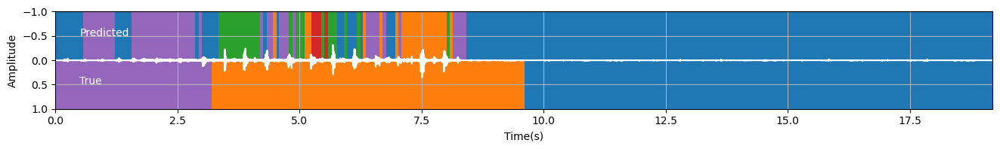

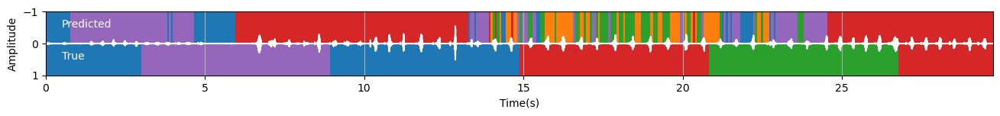

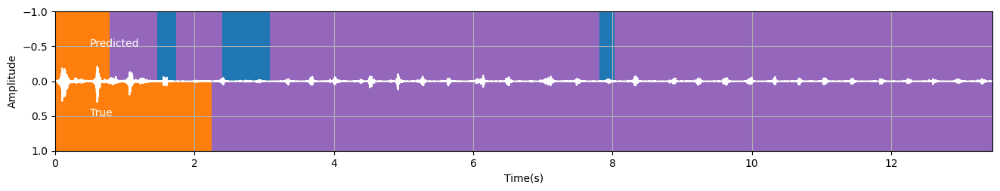

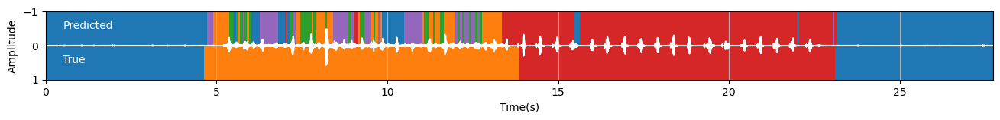

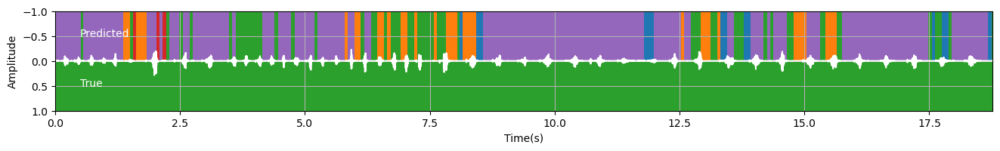

...

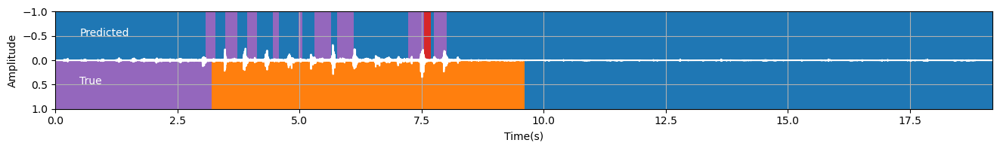

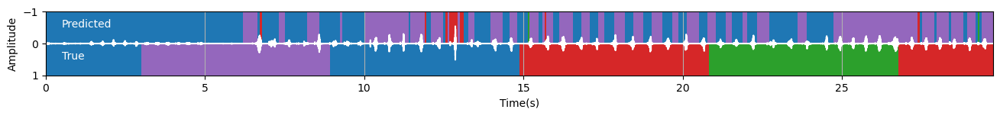

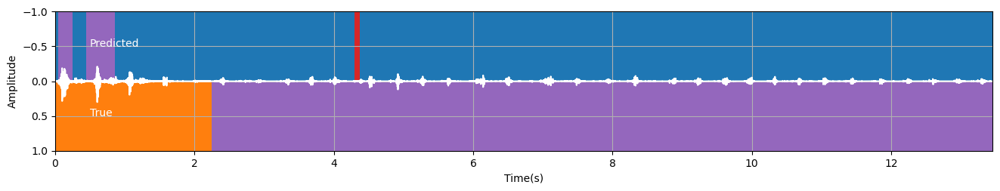

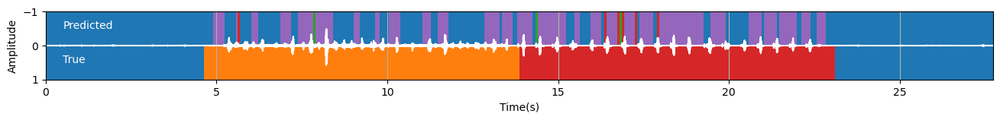

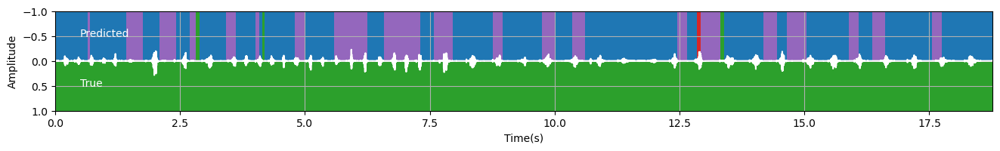

In [9]:
test_classifiers(parameters)